## Responsible AI Assignment

### Group 1 members:

1. Atharva Saney (23PGAI0069)
2. Milangiri Gauswami (23PGAI0039)
2. Garima Chaudhary (23PGAI0046)
2. Ahmedraza Sharif (23PGAI0120)
2. Akash Deshwani (23PGAI0035)
2. Anurag Pandey (23PGAI0059)

In [1]:
import logging
import numpy
import numpy as np
import pandas as pd
from math import *
from datetime import datetime
from operator import itemgetter
from zipfile import ZipFile
from io import BytesIO
import pickle
from urllib.request import urlopen

from IPython.display import Image
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from numpy import inf
from scipy.stats import kurtosis, skew

from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import ensemble
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import average_precision_score
from sklearn.metrics import mean_squared_error
from pandas.api.types import CategoricalDtype
from sklearn.preprocessing import StandardScaler, MinMaxScaler


from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics.pairwise import pairwise_distances
from scipy import spatial
from sklearn.metrics import mutual_info_score
from imblearn.over_sampling import RandomOverSampler
from sklearn.feature_selection import SelectKBest, chi2
import matplotlib.font_manager
from pdpbox import info_plots
import shap
import diffprivlib

import warnings

logging.getLogger('matplotlib.font_manager').disabled = True
warnings.filterwarnings("ignore")
scaler = MinMaxScaler()

show_plot = True

/shared-libs/python3.9/py/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Load the data

In [2]:
data = pd.read_csv("HR-Employee-Attrition.csv")

# initialize model compare
df_all_models_compare_performance_metrics = pd.DataFrame()
df_all_models_compare_fairness_metrics = pd.DataFrame()

data


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [3]:
data.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

Data dictionary:

'Age': age of the individual, 
'BusinessTravel': how often does the person travel, 
'DailyRate': Daily rate charged by the company,
'Department': Department of the person,
'DistanceFromHome': distance in kms,
'Education': education level,
'EducationField': education specialization,
'EmployeeCount': count of employees,
'EmployeeNumber': Employee ID, 
'EnvironmentSatisfaction': employee satisfaction with work culture, 
'Gender': sex, 
'HourlyRate': Hourly Rate charged by the company,
'JobInvolvement': how involved the person is in the job, 
'JobLevel': professional level of the person, 
'JobRole': type of job, 
'JobSatisfaction': how satisfied the person is with his job,
'MaritalStatus': is the person married, 
'MonthlyIncome': salary, 
'MonthlyRate': monthly rate charged by the company, 
'NumCompaniesWorked': no of companies worked before this,
'Over18': is the person over the age of 18, 
'OverTime': does the person do overtime, 
'PercentSalaryHike': persons latest salary hike, 
'PerformanceRating': performance rating given by seniors,
'RelationshipSatisfaction': relationship satisfaction with seniors, 
'StandardHours': normal workign hours, 
'StockOptionLevel': how many stock options does the employee own,
'TotalWorkingYears': total experience, 
'TrainingTimesLastYear': no of times the employee was late, 
'WorkLifeBalance': work life balance level,
'YearsAtCompany': no of years in the company, 
'YearsInCurrentRole': years at current level, 
'YearsSinceLastPromotion': no of years since last Years Since Last Promotion,
'YearsWithCurrManager': no of years under current manager


'Attrition': wheather an employee left the company or not (target variable) 


expected PII columns that may be irrelelevant:

Age, Gender, MaritalStatus, EmployeeNumber

## Helper Functions

In [4]:
evaluate_columns = [
    "Method",
    # "Eq Oppo",
    # "Eq Of Odds",
    # "Precision",
    # "Demo Parity",
    # "Avg Odds Diff",
    # "Pred equality",
    # "Pred Parity",
    # "TPR",
    # 'cost (in Mn)'
    "R-Squared",
    "Accuracy",
    "f-score",
    "Precision",
    "Recall",
    "ROC AUC Score",
    "TPR",
    "TNR",
    "FPR",
    "FNR",
    # "TP",
    # "TN",
    # "FP",
    # "FN",
]

fairness_matrics_columns = [
    "Method",
    "Equal Opportunity",
    "Equal Of Odds",
    "Precision Difference",
    "Demo Parity",
    "Avg Odds Difference",
    "Prediction equality", 
    "Prediction Parity",
    "TPR Difference",
    "cost (in Mn)",
]


def series_mode(x):
    return pd.Series.mode(x)[0]


def describe(df, stats=None):
    d = df.describe()
    if stats == None:
        return d
    return d.append(df.reindex(d.columns, axis=1).agg(stats))


def evaluate_fairness_matrics(x, y, yhat, method, fairness_column):
    y_fairness_0 = y[x[fairness_column] == 0]
    yhat_fairness_0 = yhat[x[fairness_column] == 0]
    y_fairness_1 = y[x[fairness_column] == 1]
    yhat_fairness_1 = yhat[x[fairness_column] == 1]

    cm_fairness_0 = metrics.confusion_matrix(y_fairness_0, yhat_fairness_0)
    cm_fairness_1 = metrics.confusion_matrix(y_fairness_1, yhat_fairness_1)

    # print(cm_fairness_0)
    # print(cm_fairness_1)

    tn_fairness_0, fp_fairness_0, fn_fairness_0, tp_fairness_0 = cm_fairness_0.ravel()
    tn_fairness_1, fp_fairness_1, fn_fairness_1, tp_fairness_1 = cm_fairness_1.ravel()

    TPR_0 = tp_fairness_0 / (tp_fairness_0 + fn_fairness_0)
    TPR_1 = tp_fairness_1 / (tp_fairness_1 + fn_fairness_1)
    TNR_0 = tn_fairness_0 / (tn_fairness_0 + fp_fairness_0)
    TNR_1 = tn_fairness_1 / (tn_fairness_1 + fp_fairness_1)

    FPR_0 = fp_fairness_0 / (fp_fairness_0 + tn_fairness_0)
    FPR_1 = fp_fairness_1 / (fp_fairness_1 + tn_fairness_1)
    FNR_0 = fn_fairness_0 / (tp_fairness_0 + fn_fairness_0)
    FNR_1 = fn_fairness_1 / (tp_fairness_1 + fn_fairness_1)

    # print(f" TPR {TPR_0}, {TPR_1} \n TNR {TNR_0}, {TNR_1} \n FPR {FPR_0}, {FPR_1} \n FNR {FNR_0}, {FNR_1} \n ")

    # Equal of Opportunity
    # Equal FNR
    EOpp_1 = FNR_1
    EOpp_0 = FNR_0
    EOpp_difference = abs(EOpp_0 - EOpp_1)

    # Equal of Odds
    # Equal TPR + FPR
    EOdds_1 = TPR_1 + FPR_1
    EOdds_0 = TPR_0 + FPR_0
    EOdds_difference = abs(EOdds_0 - EOdds_1)

    # Precision is TPR
    Precision_1 = TPR_1
    Precision_0 = TPR_0
    Precision_difference = abs(Precision_1 - Precision_0)

    # Demographic Parity  probability of getting positive outcome
    demographic_parity_1 = (tp_fairness_1 + fp_fairness_1) / (
        tp_fairness_1 + fp_fairness_1 + tn_fairness_1 + fn_fairness_1
    )
    demographic_parity_0 = (tp_fairness_0 + fp_fairness_0) / (
        tp_fairness_0 + fp_fairness_0 + tn_fairness_0 + fn_fairness_0
    )
    demographic_parity_difference = abs(demographic_parity_0 - demographic_parity_1)

    # Average Odds Difference
    # avg differnce in TPR and FPR
    average_odss_difference = abs(((TPR_1 - TPR_0) + (FPR_1 - FPR_0)) / 2)

    # Predictive equality
    # Equal FPR
    predictive_equality_0 = FPR_0
    predictive_equality_1 = FPR_1
    predictive_equality_difference = abs(predictive_equality_0 - predictive_equality_1)

    # Predictive parity
    # Equal PPV (Positive predictive value) / Precision
    predictive_parity_0 = TPR_0
    predictive_parity_1 = TPR_1
    predictive_parity_difference = abs(predictive_parity_0 - predictive_parity_1)

    # TPR
    tpr_difference = abs(TPR_0 - TNR_1)

    # cost calculating
    cost_0 = (fp_fairness_0 * 7) + (fn_fairness_0 * 3)
    cost_1 = (fp_fairness_1 * 7) + (fn_fairness_1 * 3)
    total_cost = (cost_0 + cost_1) / 30000

    return [
        method,
        EOpp_difference,
        EOdds_difference,
        Precision_difference,
        demographic_parity_difference,
        average_odss_difference,
        predictive_equality_difference,
        predictive_parity_difference,
        tpr_difference,
        total_cost,
    ]


def evaluate(y, yhat, method):
    d = y - yhat
    r2 = metrics.r2_score(y, yhat)
    accu = metrics.accuracy_score(y, yhat)
    f1 = metrics.f1_score(y, yhat)
    precision = metrics.precision_score(y, yhat)
    recall = metrics.recall_score(y, yhat)
    auc = metrics.roc_auc_score(y, yhat)
    cm = metrics.confusion_matrix(y, yhat)
    tn, fp, fn, tp = cm.ravel()

    tpr = tp / (tp + fn)
    tnr = tn / (tn + fp)
    fpr = fp / (tn + fp)
    fnr = fn / (tp + fn)

    return [
        method,
        abs(r2),
        accu,
        f1,
        precision,
        recall,
        auc,
        tpr,
        tnr,
        fpr,
        fnr,
        #   tp,
        #   tn,
        #   fp,
        #   fn
    ]


def draw_df_compare_graph(df_compare, graph_title="Fairness Metrics"):
    bar_color = sns.color_palette("flare", len(df_compare))
    bar_color2 = ['#dc143c', '#00ffff', '#0000ff', '#adff2f', '#ff00ff', '#1e90ff', '#f0e68c', '#fa8072',\
    '#ffff54', '#90ee90', '#add8e6', '#ff1493', '#7b68ee', '#ee82ee', '#ffc0cb', '#7f007f', '#8fbc8f', \
    '#b03060', '#ff4500', '#ff8c00', '#00ff00', '#9400d3', '#00ff7f', '#008000', '#b8860b', '#008b8b', \
    '#4682b4', '#00008b', '#696969', '#556b2f', '#7f0000', '#483d8b']

    if 'Equal Opportunity' in df_compare.columns:
        df_compare = df_compare.sort_values(by=['Precision Difference', 'Prediction Parity'])

    else:
        df_compare = df_compare.sort_values(by=['Accuracy','f-score'])

    df_compare.set_index("Method").T.plot.bar(
        rot=90, width=0.7, figsize=(10, 5), fontsize=12, color=bar_color2
    )
    plt.xticks(rotation=45, ha='right')
    plt.title(f"{graph_title} comparison of different models")
    plt.xlabel(f"{graph_title}")
    plt.ylabel("Score")
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))


def draw_df_compare_graph_for_each_metric(df_compare, graph_title="Performance Metrics"):
    bar_color = sns.color_palette("flare", len(df_compare))
    bar_color2 = ['#dc143c', '#00ffff', '#0000ff', '#adff2f', '#ff00ff', '#1e90ff', '#f0e68c', '#fa8072',\
    '#ffff54', '#90ee90', '#add8e6', '#ff1493', '#7b68ee', '#ee82ee', '#ffc0cb', '#7f007f', '#8fbc8f', \
    '#b03060', '#ff4500', '#ff8c00', '#00ff00', '#9400d3', '#00ff7f', '#008000', '#b8860b', '#008b8b', \
    '#4682b4', '#00008b', '#696969', '#556b2f', '#7f0000', '#483d8b']
    
    if 'Equal Opportunity' in df_compare.columns:
        df_compare = df_compare.sort_values(by=['Precision Difference', 'Prediction Parity'])

    else:
        df_compare = df_compare.sort_values(by=['Accuracy','f-score'])

    graph_df = df_compare.set_index("Method")
    graph_columns = graph_df.columns

    for single_column in graph_columns:
        graph_df[[single_column]].plot.bar(
            rot=90, width=0.7, figsize=(10, 3), fontsize=12, color=bar_color2
        )
        plt.xticks(rotation=45, ha='right')
        plt.title(f"{graph_title} comparison of different models")
        plt.xlabel(f"{single_column}")
        plt.ylabel("Score")
        plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))


## EDA

In [5]:
data.shape


(1470, 35)

In [6]:
data.columns


Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [7]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [8]:
data.isnull().sum()


Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [9]:
for col in data.columns:
    if len(data[col].unique()) < 2:
        print(f"Removing {col}")
        data.drop(col, inplace=True, axis=1)

data.drop("EmployeeNumber", inplace=True, axis=1)
data["Attrition_en"] = np.where(data["Attrition"] == "Yes", 1, 0)
data.columns


Removing EmployeeCount
Removing Over18
Removing StandardHours


Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager', 'Attrition_en'],
      dtype='object')

In [10]:
for col in data.columns:
    if data[col].dtype == "object":
        print(col)
        print(data[col].value_counts())
        print("\n")


Attrition
No     1233
Yes     237
Name: Attrition, dtype: int64


BusinessTravel
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


Department
Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


EducationField
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


Gender
Male      882
Female    588
Name: Gender, dtype: int64


JobRole
Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64


MaritalStatus
Married     673
Single      470
Divorced    327
Name: Marital

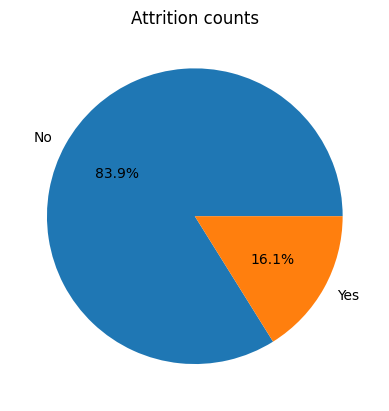

In [11]:
plt.pie(np.array(data["Attrition_en"].value_counts()), labels=['No', 'Yes'], autopct="%1.1f%%")
plt.title("Attrition counts")
plt.show()


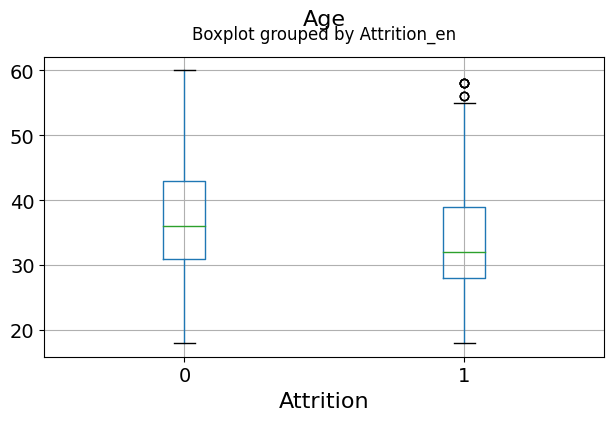

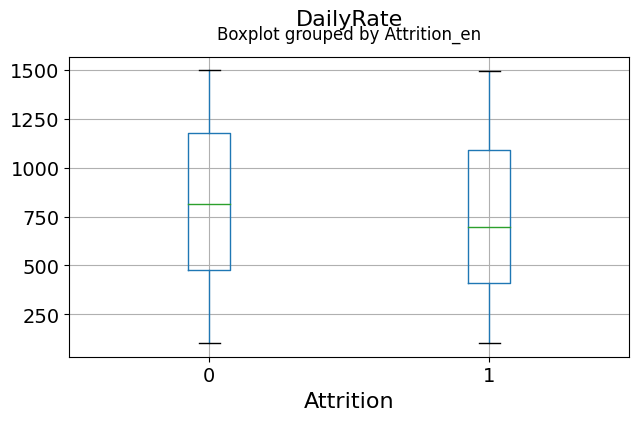

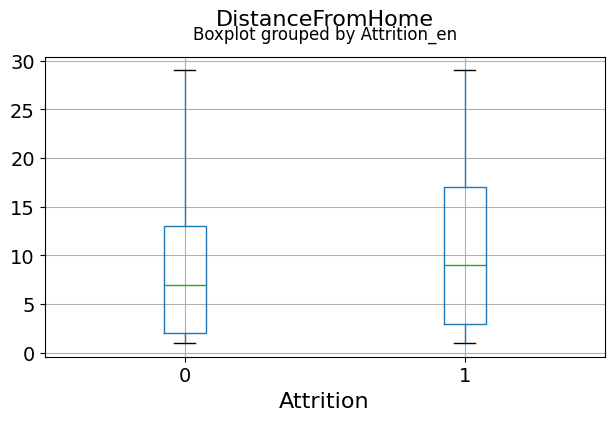

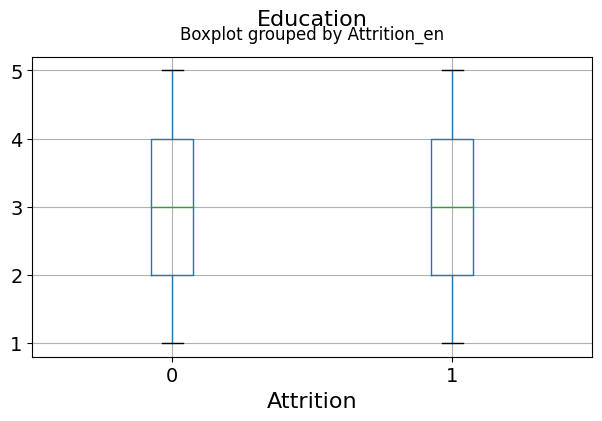

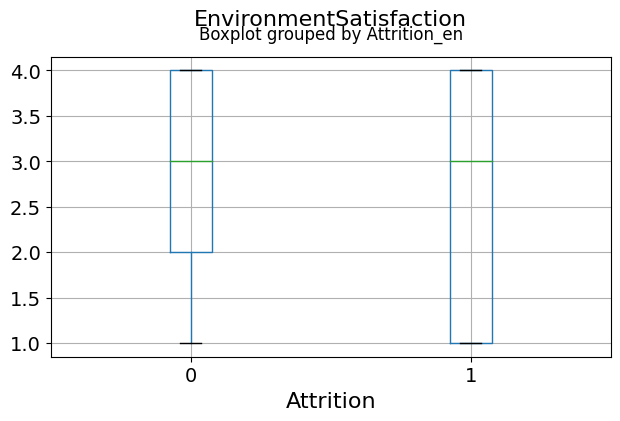

...

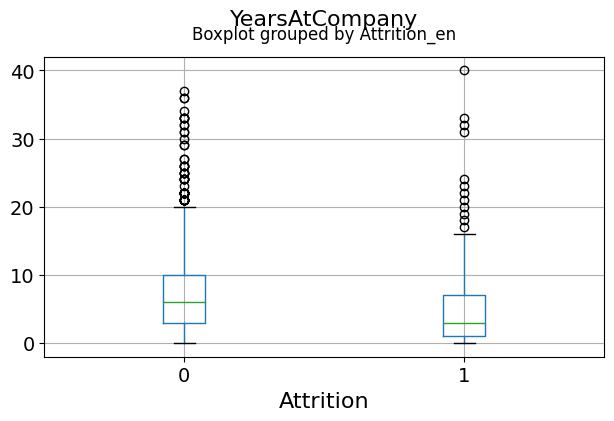

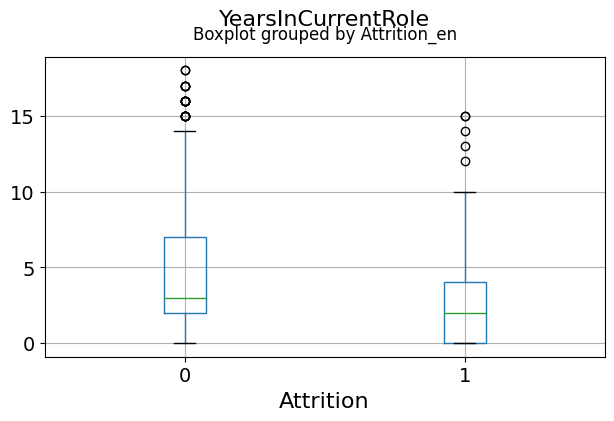

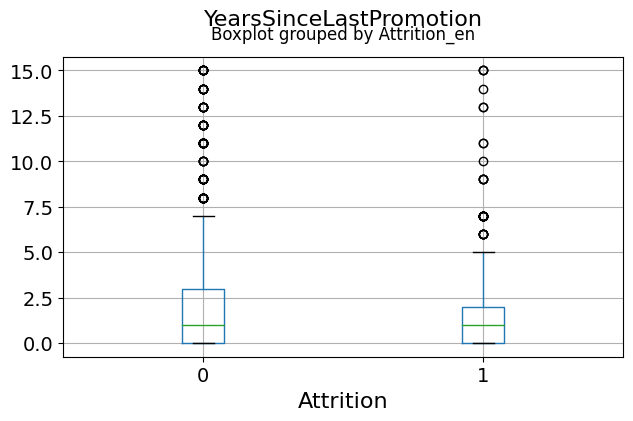

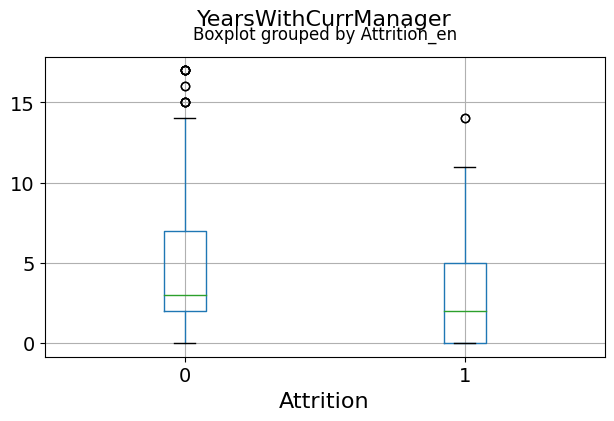

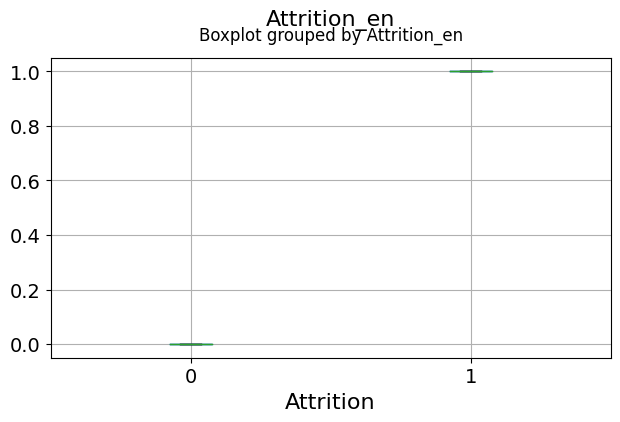

In [12]:
if show_plot:
    for c in data.columns:
        if data[c].dtype != "object":
            data.boxplot(c, by="Attrition_en", figsize=(7, 4), fontsize=14)
            plt.title("{}\n".format(c), fontsize=16)
            plt.xlabel("Attrition", fontsize=16)


The above boxplots show that there is no specific feature that explains the attrition of employees on its own

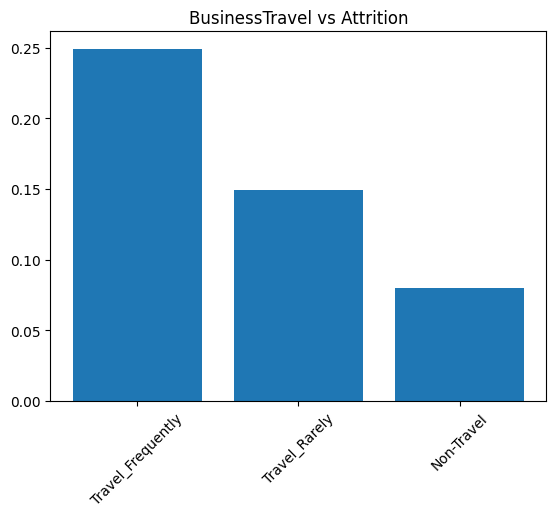

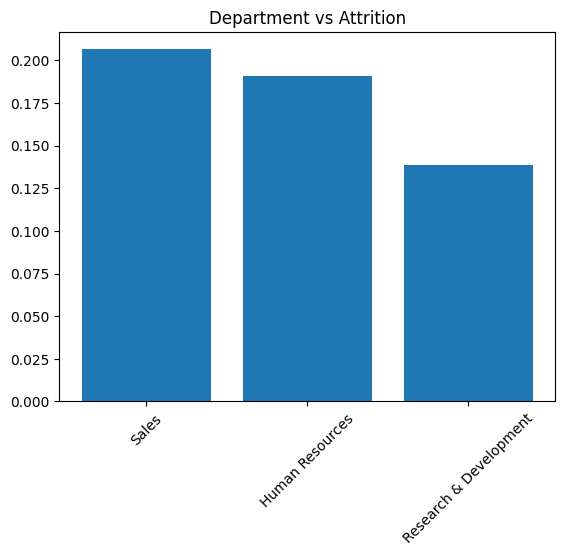

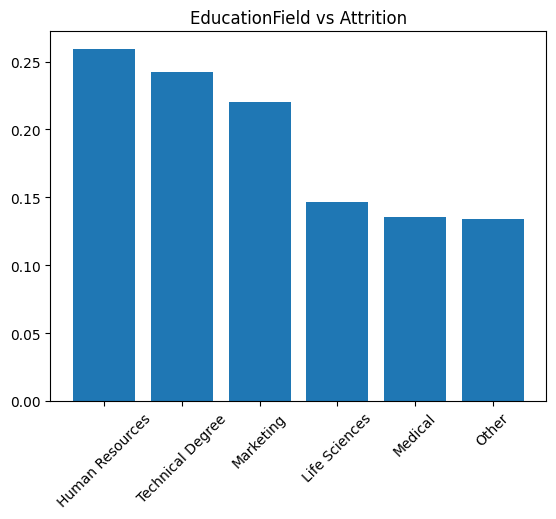

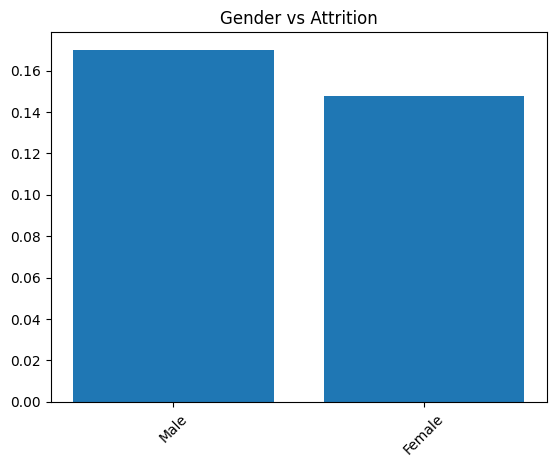

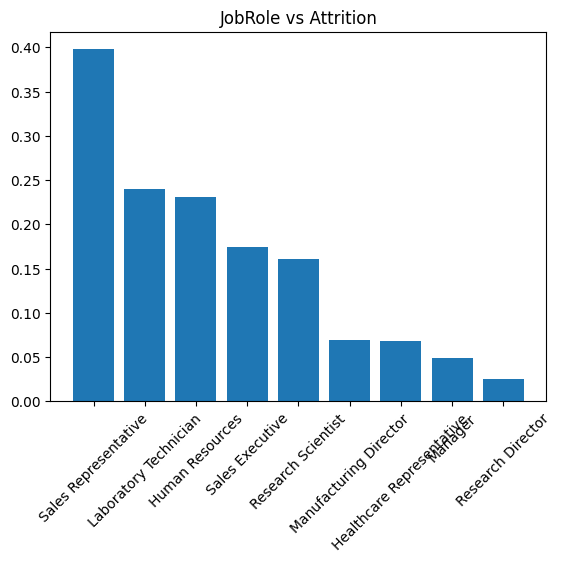

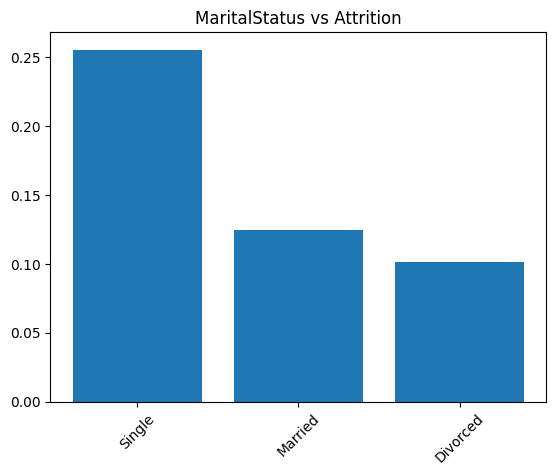

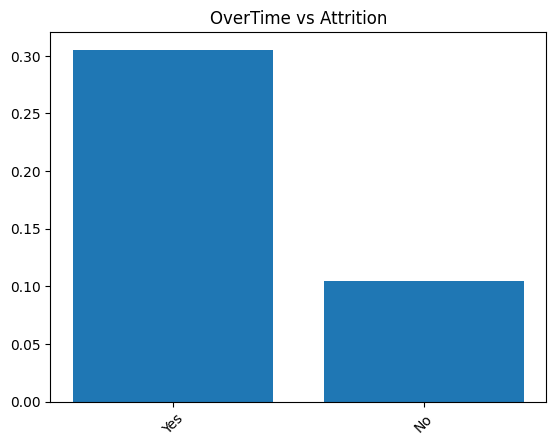

In [13]:
textCol = []
for c in data.columns:
    if (data[c].dtype == "object") and (c not in ["Attrition_en", "Attrition"]):
        textCol.append(c)
        df_loop = (
            data[[c, "Attrition_en"]]
            .groupby(c, as_index=False)
            .mean()
            .sort_values(by=["Attrition_en"], ascending=False)
        )

        if show_plot:
            plt.bar(df_loop[c], df_loop["Attrition_en"])
            plt.title(c + " vs Attrition")
            plt.xticks(rotation=45)
            plt.show()


In [14]:
data.groupby(by=['BusinessTravel', 'Gender'])['Attrition'].value_counts()

BusinessTravel     Gender  Attrition
Non-Travel         Female  No            46
                           Yes            3
                   Male    No            92
                           Yes            9
Travel_Frequently  Female  No            87
                           Yes           30
                   Male    No           121
                           Yes           39
Travel_Rarely      Female  No           368
                           Yes           54
                   Male    No           519
                           Yes          102
Name: Attrition, dtype: int64

In [15]:
textCol

['BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'OverTime']

In [16]:
data.corr(method="pearson")

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition_en
Age,1.000000,0.010661,-0.001686,0.208034,0.010146,0.024287,0.029820,0.509604,-0.004892,0.497855,...,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089,-0.159205
DailyRate,0.010661,1.000000,-0.004985,-0.016806,0.018355,0.023381,0.046135,0.002966,0.030571,0.007707,...,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363,-0.056652
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,-0.016075,0.031131,0.008783,0.005303,-0.003669,-0.017014,...,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406,0.077924
Education,0.208034,-0.016806,0.021042,1.000000,-0.027128,0.016775,0.042438,0.101589,-0.011296,0.094961,...,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065,-0.031373
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,1.000000,-0.049857,-0.008278,0.001212,-0.006784,-0.006259,...,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999,-0.103369
HourlyRate,0.024287,0.023381,0.031131,0.016775,-0.049857,1.000000,0.042861,-0.027853,-0.071335,-0.015794,...,0.001330,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123,-0.006846
JobInvolvement,0.029820,0.046135,0.008783,0.042438,-0.008278,0.042861,1.000000,-0.012630,-0.021476,-0.015271,...,0.034297,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976,-0.130016
JobLevel,0.509604,0.002966,0.005303,0.101589,0.001212,-0.027853,-0.012630,1.000000,-0.001944,0.950300,...,0.021642,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281,-0.169105
JobSatisfaction,-0.004892,0.030571,-0.003669,-0.011296,-0.006784,-0.071335,-0.021476,-0.001944,1.000000,-0.007157,...,-0.012454,0.010690,-0.020185,-0.005779,-0.019459,-0.003803,-0.002305,-0.018214,-0.027656,-0.103481
MonthlyIncome,0.497855,0.007707,-0.017014,0.094961,-0.006259,-0.015794,-0.015271,0.950300,-0.007157,1.000000,...,0.025873,0.005408,0.772893,-0.021736,0.030683,0.514285,0.363818,0.344978,0.344079,-0.159840


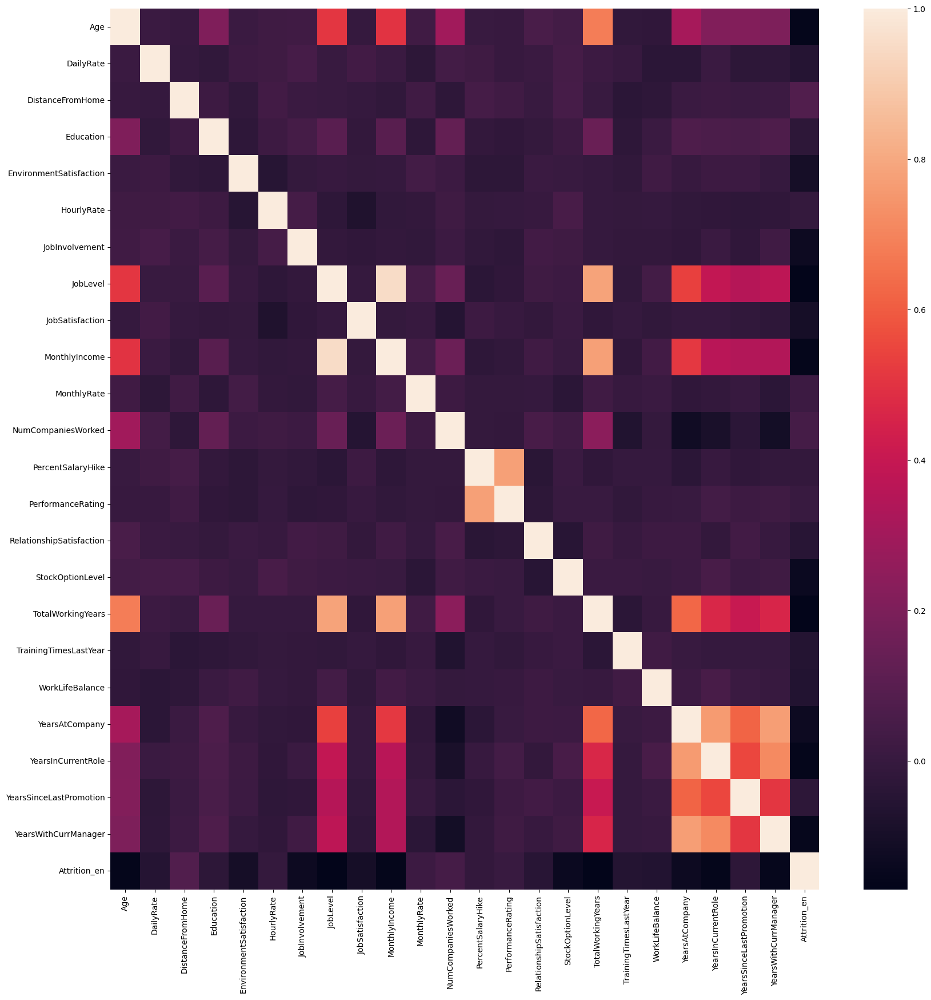

In [17]:
plt.figure(figsize=(20, 20))
sns.heatmap(data.iloc[:, :].corr(), annot=False)
plt.show()


## Feature Engineering

In [18]:
# feature 1

def idealEmp(data):
    if (data['Education'] >= 3) and (data['EnvironmentSatisfaction'] >= 3) and (
        data['JobInvolvement'] >= 2) and (data['StockOptionLevel'] >= 1):
        return 1
    else:
        return 0

data['IdealEmployee'] = data.apply(lambda data:idealEmp(data) ,axis = 1)
print(data.groupby('IdealEmployee')['Attrition'].value_counts())

# feature 2

def undervaluedEmp(data):
    if (data['MonthlyIncome'] <= incomeM) and (
        data['MonthlyRate'] >= rateM):
        return 1
    else:
        return 0

incomeM = data['MonthlyIncome'].mean()
rateM = data['MonthlyRate'].mean()

data['undervaluedEmp'] = data.apply(lambda data:undervaluedEmp(data) ,axis = 1)
print(data.groupby('undervaluedEmp')['Attrition'].value_counts())

IdealEmployee  Attrition
0              No           917
               Yes          212
1              No           316
               Yes           25
Name: Attrition, dtype: int64
undervaluedEmp  Attrition
0               No           854
                Yes          141
1               No           379
                Yes           96
Name: Attrition, dtype: int64


In [19]:
data['MonthlyIncome'].mean()

6502.931292517007

## EDA with Encoding

since there are no null values, imputation is not required. However, we will need to encode the textual columns

In [20]:
x = data.drop(["Attrition", "Attrition_en"], axis=1)
y = data["Attrition_en"]

ros = RandomOverSampler(sampling_strategy="minority", random_state=1)

x, y = ros.fit_resample(x, y)

numCol = np.setdiff1d(x.columns, textCol)


def encode_data(df, textCol=textCol):
    df = df.copy()
    df = df[textCol]
    df = pd.get_dummies(df, columns=textCol, drop_first=True)
    return df


x_en = encode_data(x, textCol=textCol)

print(len(x_en.columns))

# selector = SelectKBest(chi2, k=20)
# selector.fit_transform(x_en, y)

# cols = selector.get_support(indices=True)
# x_en = x_en.iloc[:, cols]

# print(x_en.columns)
# print(numerical_columns)


x = pd.concat(
    [x[numCol], x_en], axis=1, join="inner"
)

print(x.columns)
x

21
Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'HourlyRate', 'IdealEmployee',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'undervaluedEmp',
       'BusinessTravel_Travel_Frequently', 'BusinessTravel_Travel_Rarely',
       'Department_Research & Development', 'Department_Sales',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'EducationField_Technical Degree', 'Gender_Male',
       'JobRole_Human Resources', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,IdealEmployee,JobInvolvement,JobLevel,JobSatisfaction,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1102,1,2,2,94,0,3,2,4,...,0,0,0,0,0,1,0,0,1,1
1,49,279,8,1,3,61,0,2,2,2,...,0,0,0,0,1,0,0,1,0,0
2,37,1373,2,2,4,92,0,2,1,3,...,1,0,0,0,0,0,0,0,1,1
3,33,1392,3,4,4,56,0,3,1,3,...,0,0,0,0,1,0,0,1,0,1
4,27,591,2,1,1,40,0,3,1,2,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,46,669,9,2,3,64,0,2,3,4,...,0,0,0,0,0,1,0,0,1,0
2462,27,1420,2,1,3,85,0,3,1,1,...,0,0,0,0,0,0,1,0,0,0
2463,25,383,9,2,1,68,0,2,1,1,...,0,0,0,0,0,0,1,1,0,0
2464,24,1448,1,1,1,62,0,3,1,2,...,0,0,0,0,0,0,1,0,1,1


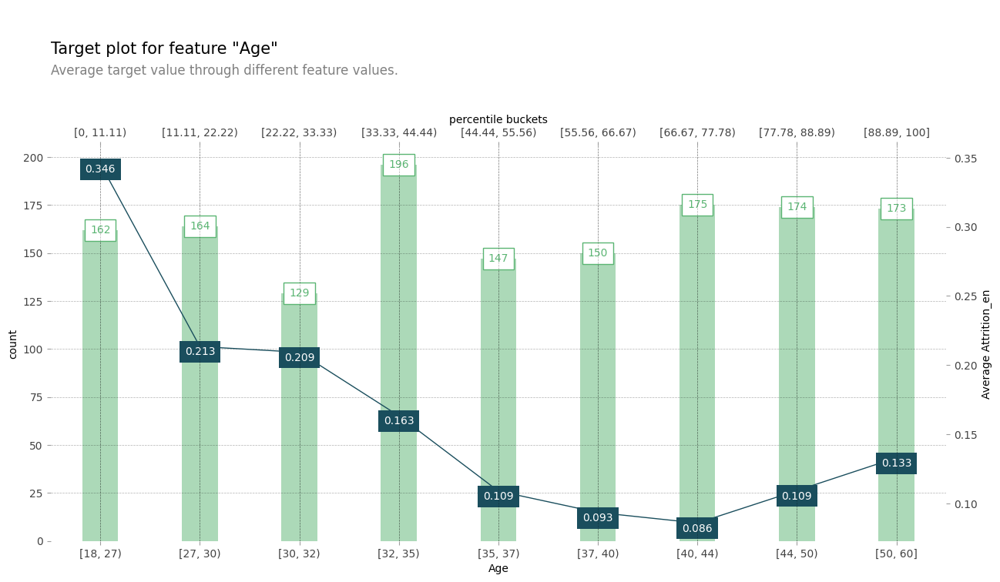

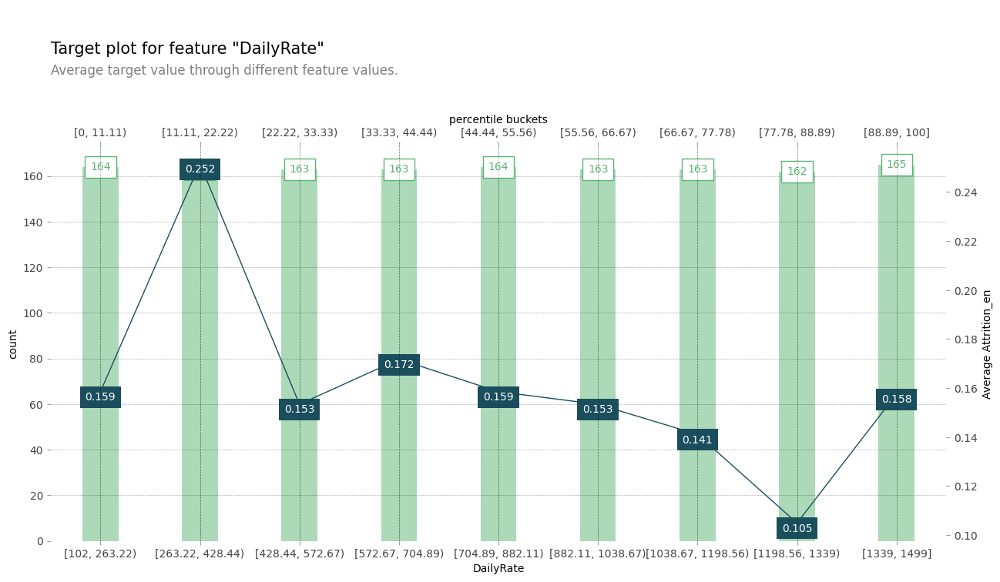

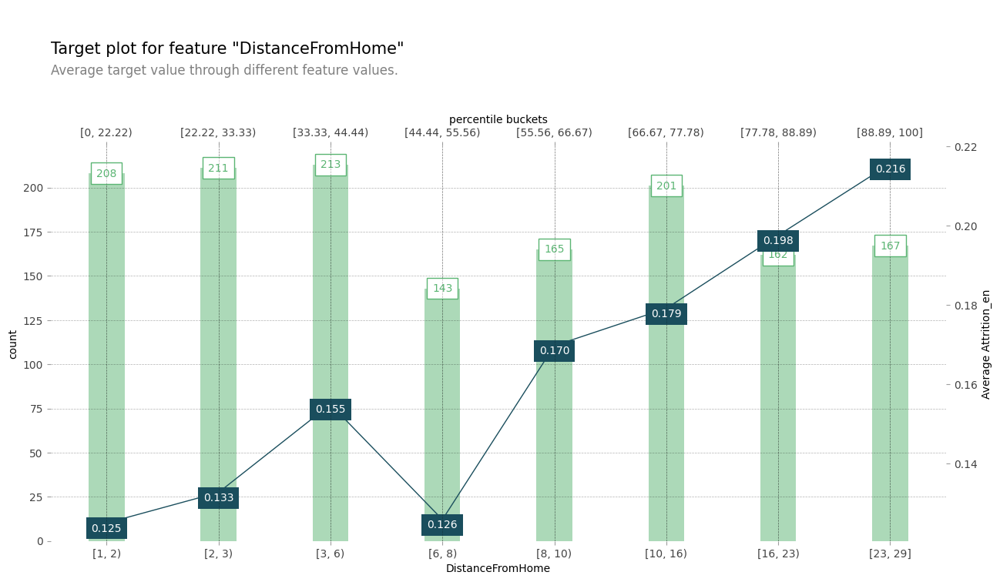

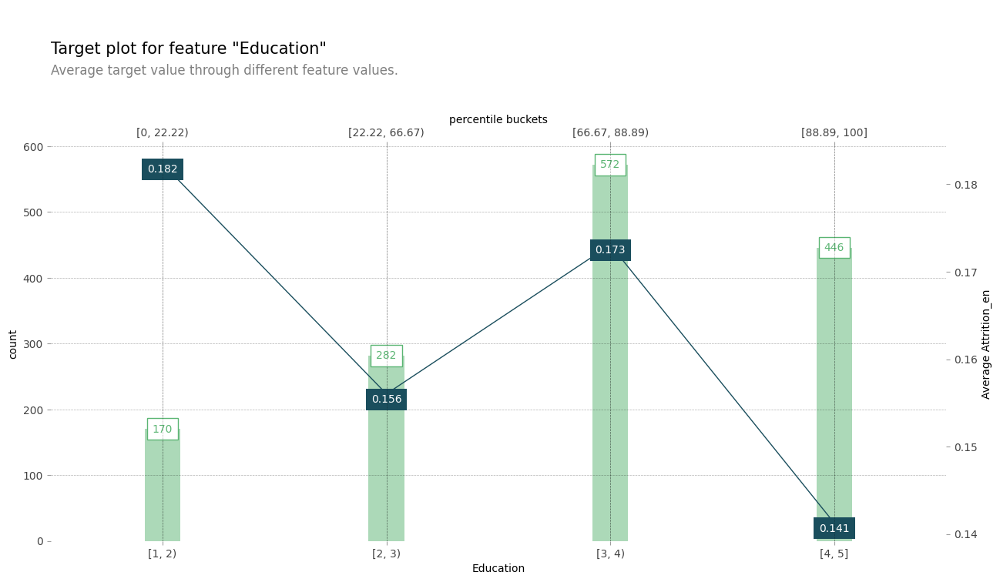

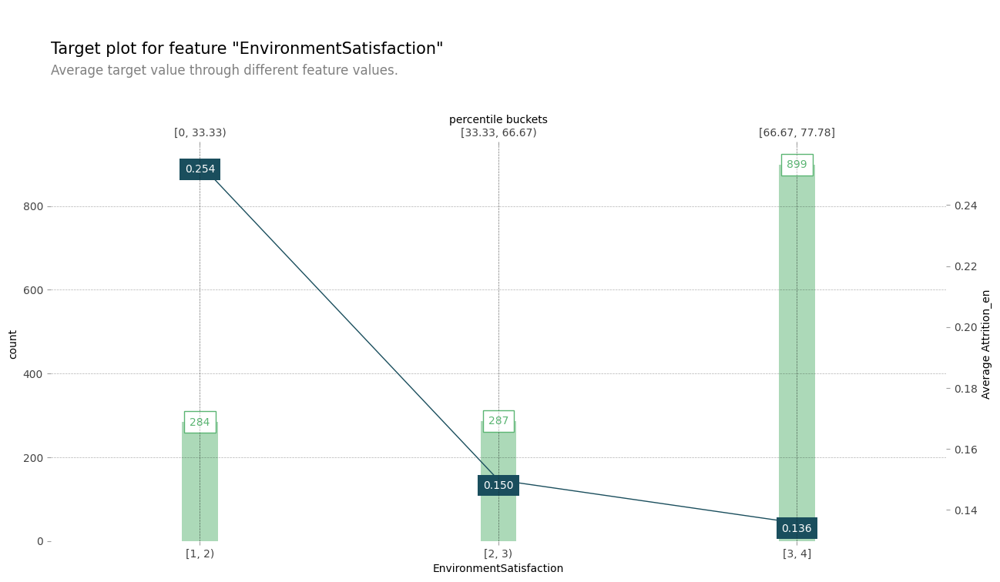

...

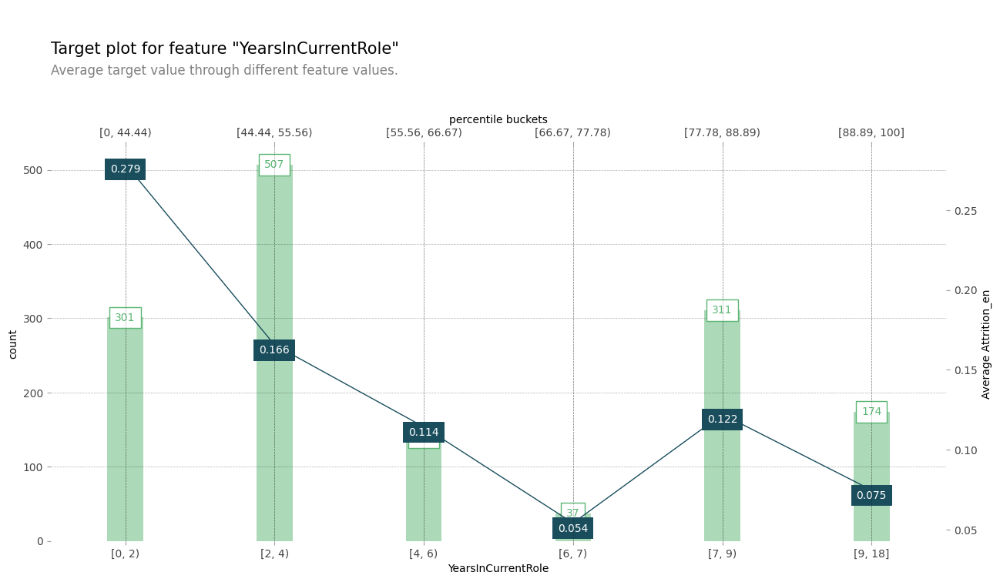

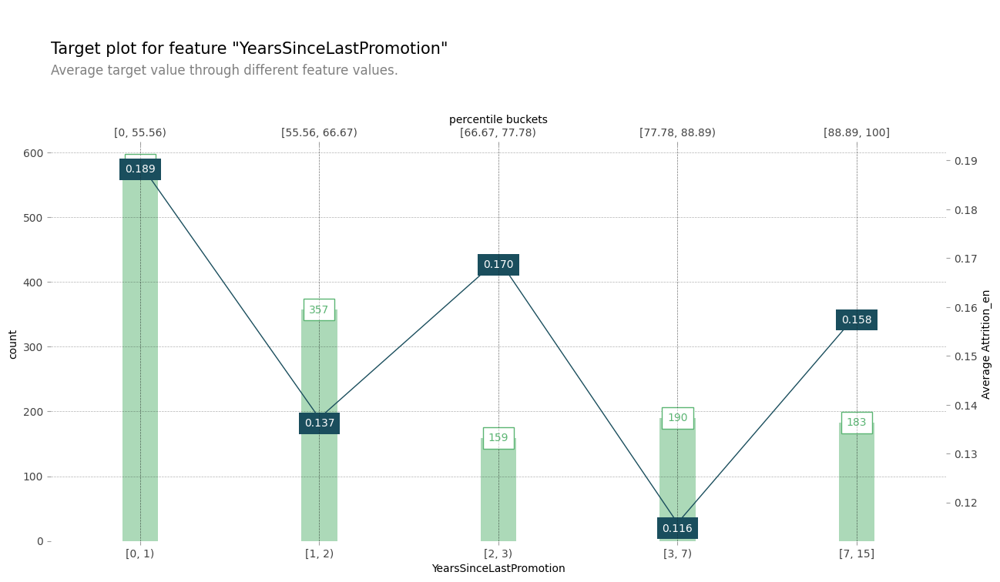

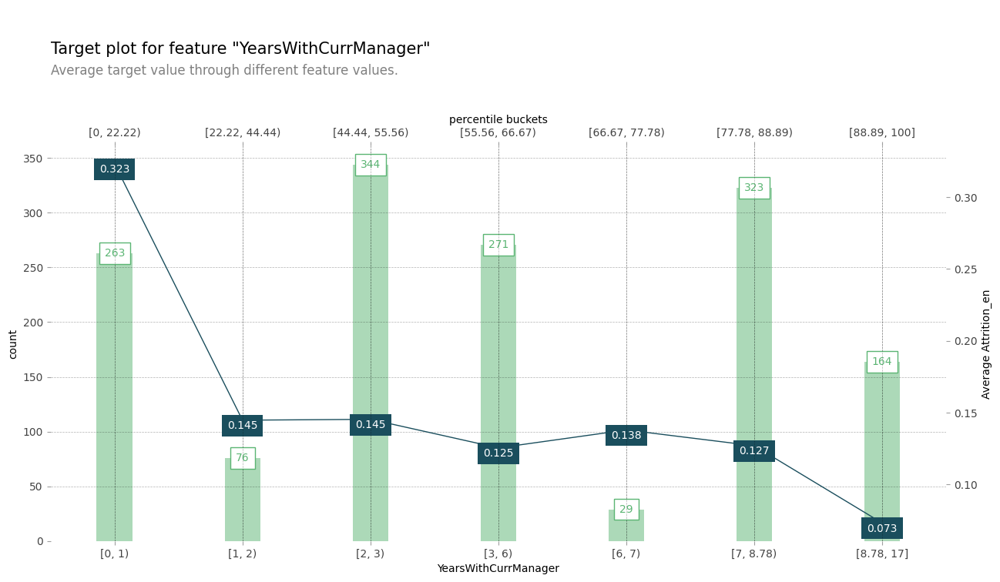

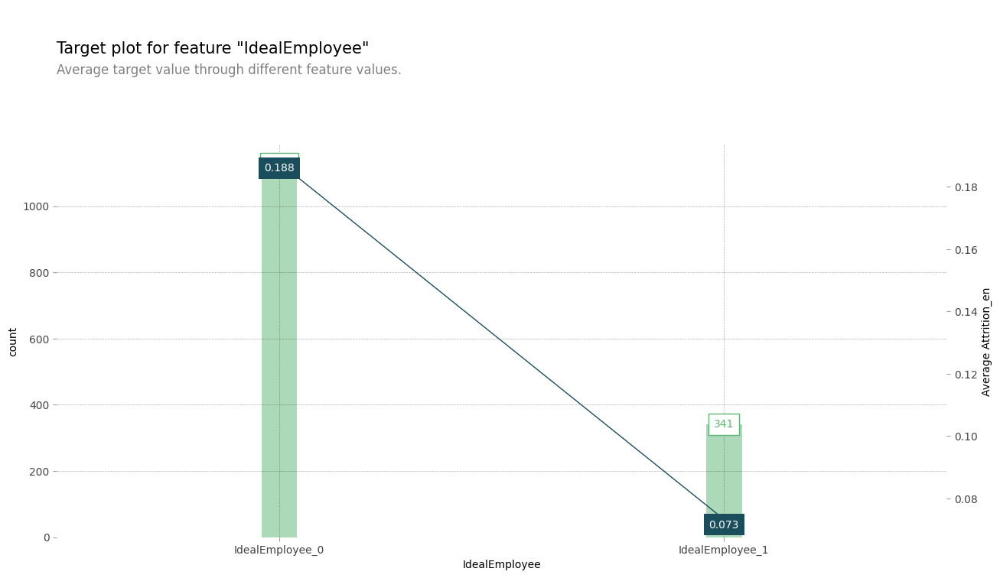

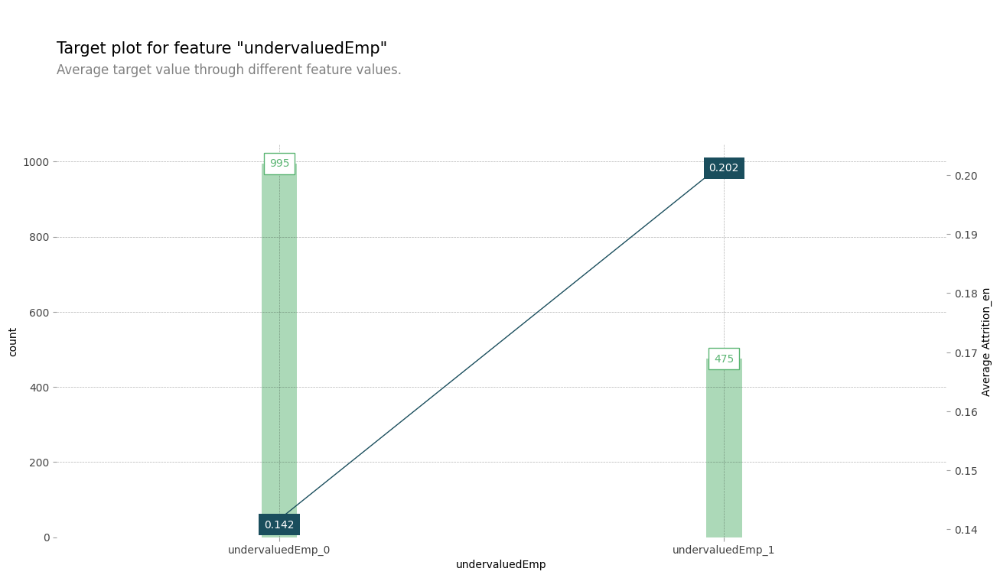

In [21]:
## Information Value plots

from pdpbox import pdp, get_dataset, info_plots

for col in data.columns:
    if col not in textCol + ['Attrition', 'Attrition_en']:
        fig, axes, summary_df = info_plots.target_plot(
        df=data, feature=col, feature_name=col, target='Attrition_en', show_percentile=True)
        fig.show()

### Detecting Proxy features

 we will look at VIF as a primary eliminator. We will use mutual information technique to detect proxy features, and we will see cosine distance, just to be sure.

#### VIF

In [22]:
def calculate_vif(df, thresh=20.0):
    variables = [df.columns[i] for i in range(df.shape[1])]
    dropped = True
    while dropped:
        dropped = False
        vif = [
            variance_inflation_factor(df[variables].values, ix)
            for ix in range(len(variables))
        ]

        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print(
                "VIF is "
                + str(max(vif))
                + " "
                + "dropping "
                + df[variables].columns[maxloc]
            )

            variables.pop(maxloc)
            dropped = True

    return variables

In [23]:
vif_columns = calculate_vif(x)
vif_columns


VIF is 167.82566973212724 dropping PerformanceRating
VIF is 96.93473817585979 dropping Department_Research & Development
VIF is 59.683199058175816 dropping JobLevel
VIF is 31.837020556157995 dropping Age
VIF is 31.36195654249229 dropping Department_Sales
VIF is 22.389351241770875 dropping MonthlyIncome
VIF is 21.40271912096025 dropping EducationField_Life Sciences


['DailyRate',
 'DistanceFromHome',
 'Education',
 'EnvironmentSatisfaction',
 'HourlyRate',
 'IdealEmployee',
 'JobInvolvement',
 'JobSatisfaction',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'undervaluedEmp',
 'BusinessTravel_Travel_Frequently',
 'BusinessTravel_Travel_Rarely',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'Gender_Male',
 'JobRole_Human Resources',
 'JobRole_Laboratory Technician',
 'JobRole_Manager',
 'JobRole_Manufacturing Director',
 'JobRole_Research Director',
 'JobRole_Research Scientist',
 'JobRole_Sales Executive',
 'JobRole_Sales Representative',
 'MaritalStatus_Married',
 'MaritalStatus_Single',
 'OverTime_Yes']

#### Cosine Similarity

In [24]:
def calculate_cosine(df, thresh=0.5):
    # closer to zero more simmiliar they are
    variables = [df.columns[i] for i in range(df.shape[1])]
    dropped = True
    while dropped == True:
        dropped = False
        min_distance = []
        min_distance_id = []
        for i, column_i in enumerate(variables):
            min_distance_i = 2
            for j, column_j in enumerate(variables[i + 1 :]):
                result = spatial.distance.cosine(df[column_i], df[column_j])
                min_distance_i = result if result < min_distance_i else min_distance_i
            min_distance_id.append(j)
            min_distance.append(min_distance_i)
        cosine_distance = min(min_distance)
        if cosine_distance < thresh:
            idx = min_distance.index(min(min_distance))
            print(
                "Cosine Distance is "
                + str(cosine_distance)
                + " "
                + "for "
                + variables[idx]
                + " and "
                + variables[min_distance_id[idx]]
            )
            variables.pop(idx)
            dropped = True
    return variables


In [25]:
cosine_columns = calculate_cosine(x)
cosine_columns


Cosine Distance is 0.01375826684206638 for PercentSalaryHike and EducationField_Medical
Cosine Distance is 0.023460407310618825 for JobLevel and JobRole_Laboratory Technician
Cosine Distance is 0.04055464727174163 for Age and MaritalStatus_Single
Cosine Distance is 0.04107323482836456 for PerformanceRating and EducationField_Technical Degree
Cosine Distance is 0.07079732081376344 for JobInvolvement and JobRole_Manufacturing Director
Cosine Distance is 0.07881629868758255 for HourlyRate and JobRole_Research Scientist
Cosine Distance is 0.08256748915095924 for MonthlyIncome and JobRole_Manufacturing Director
Cosine Distance is 0.09493704421398863 for Education and JobRole_Sales Representative
Cosine Distance is 0.10159249903619705 for YearsAtCompany and EducationField_Other
Cosine Distance is 0.11161348738369625 for RelationshipSatisfaction and JobRole_Manager
Cosine Distance is 0.11365551789533468 for JobSatisfaction and JobRole_Research Scientist
Cosine Distance is 0.11791415946921202 

['IdealEmployee',
 'undervaluedEmp',
 'BusinessTravel_Travel_Frequently',
 'EducationField_Life Sciences',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'Gender_Male',
 'JobRole_Human Resources',
 'JobRole_Laboratory Technician',
 'JobRole_Manager',
 'JobRole_Manufacturing Director',
 'JobRole_Research Director',
 'JobRole_Research Scientist',
 'JobRole_Sales Executive',
 'JobRole_Sales Representative',
 'MaritalStatus_Married',
 'MaritalStatus_Single',
 'OverTime_Yes']

#### Mutual Information

In [26]:
def calculate_mutual_information(df, thresh=0.9):
    # higher the value more simmiliar they are
    variables = [df.columns[i] for i in range(df.shape[1])]
    dropping_column = set()
    simmiliarity_list = []
    for i, column_i in enumerate(variables):
        for j, column_j in enumerate(variables[i + 1 :]):
            result = mutual_info_score(df[column_i], df[column_j])
            if result > thresh:
                print(
                    "Mutual Information score is "
                    + str(result)
                    + " "
                    + "for "
                    + column_i
                    + " and "
                    + column_j
                )
                dropping_column.add(column_i)
    for i in dropping_column:
        variables.remove(i)
    return variables


In [27]:
mutual_information_columns = calculate_mutual_information(x)
mutual_information_columns


Mutual Information score is 3.087936806536491 for Age and DailyRate
Mutual Information score is 1.1509880273295825 for Age and HourlyRate
Mutual Information score is 3.460564487531976 for Age and MonthlyIncome
Mutual Information score is 3.5290953935114655 for Age and MonthlyRate
Mutual Information score is 0.9889933602924057 for Age and TotalWorkingYears
Mutual Information score is 2.617038261408786 for DailyRate and DistanceFromHome
Mutual Information score is 1.0536133777971808 for DailyRate and Education
Mutual Information score is 1.0118475982541582 for DailyRate and EnvironmentSatisfaction
Mutual Information score is 3.7268658208208247 for DailyRate and HourlyRate
Mutual Information score is 0.9467350995451872 for DailyRate and JobLevel
Mutual Information score is 1.0011842255230035 for DailyRate and JobSatisfaction
Mutual Information score is 6.3364782642828095 for DailyRate and MonthlyIncome
Mutual Information score is 6.4055315015093965 for DailyRate and MonthlyRate
Mutual Inf

['IdealEmployee',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'undervaluedEmp',
 'BusinessTravel_Travel_Frequently',
 'BusinessTravel_Travel_Rarely',
 'Department_Research & Development',
 'Department_Sales',
 'EducationField_Life Sciences',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'Gender_Male',
 'JobRole_Human Resources',
 'JobRole_Laboratory Technician',
 'JobRole_Manager',
 'JobRole_Manufacturing Director',
 'JobRole_Research Director',
 'JobRole_Research Scientist',
 'JobRole_Sales Executive',
 'JobRole_Sales Representative',
 'MaritalStatus_Married',
 'MaritalStatus_Single',
 'OverTime_Yes']

In [28]:
## using Mutual information, we can find the proxy features

proxy = [i for i in x.columns if i not in mutual_information_columns]
proxy


['Age',
 'DailyRate',
 'DistanceFromHome',
 'Education',
 'EnvironmentSatisfaction',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MonthlyIncome',
 'MonthlyRate',
 'TotalWorkingYears',
 'YearsAtCompany']

So we have found all the PII columns (in the beginning) and now using VIF and mutual information we have found the proxy features for those PII columns. While trainning the model, we will drop all the PII columns. But to fully ensure the privacy of the data, i.e. to ensure that the individual cannot be identified or reverse engineered from the data, we will apply differential privacy (DP) on the proxy features.

## Apply privacy algorithms

Now that we have the proxy features, we will apply DP on one of those features.

We know that Age is a PII column, so we will apply DP on its proxy feature, which is 'DailyRate, found using mutual information.



In [29]:
original = x["DailyRate"].mean()

sensitivity = x["DailyRate"].max() / (len(x) + 1)
print(f"Sensitivity for Age: {sensitivity}")

V = []
ep = []
count = []

for j in range(1, 6):
    epsilon = j / 10

    for i in range(0, 101):

        value = x["DailyRate"].mean() + np.random.laplace(
            loc=0, scale=sensitivity / epsilon
        )
        V.append(value)
        ep.append(epsilon)
        count.append(i)

fra = pd.DataFrame({"Value": V, "ep": ep, "count": count})
print(len(fra))
fra.head(10)


Sensitivity for Age: 0.6076205918119173
505


,Value,ep,count
0,773.146181,0.1,0
1,783.186016,0.1,1
2,785.570740,0.1,2
3,777.396259,0.1,3
4,784.867862,0.1,4
5,802.662001,0.1,5
6,789.532512,0.1,6
7,793.065865,0.1,7
8,777.764686,0.1,8
9,796.421289,0.1,9


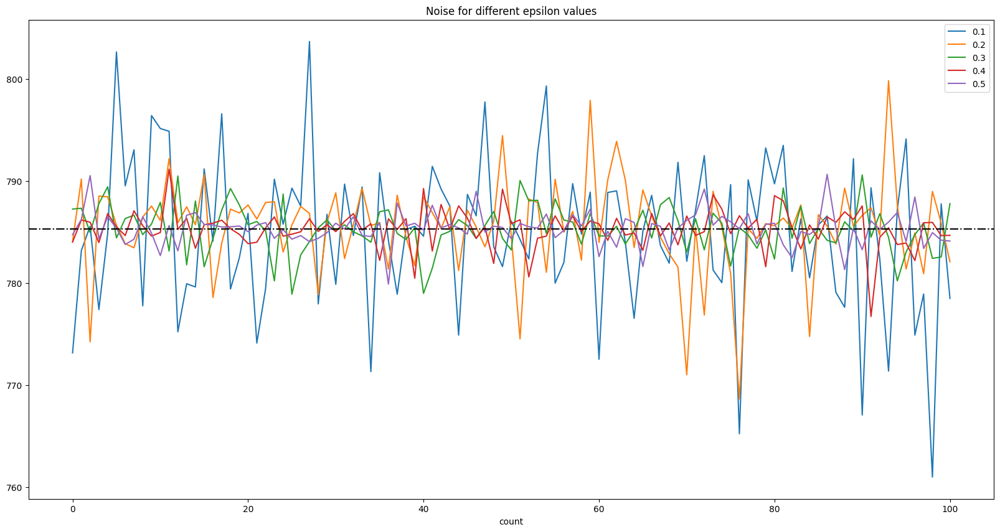

In [30]:
fig, ax = plt.subplots(figsize=(20, 10))
for name, group in fra.groupby("ep"):
    group.plot("count", y="Value", ax=ax, label=name)
plt.axhline(y=original, color="black", linestyle="-.")
plt.title('Noise for different epsilon values')
plt.show()


In [31]:
dp_data = pd.DataFrame()
ep_col = x["DailyRate"]

dp_data["DailyRate"] = ep_col
for i in [0.3, 0.0001]:
    epsilon = i
    dp_data[f"DailyRate DP {epsilon}"] = ep_col.apply(
        lambda age: age + np.random.laplace(loc=0, scale=sensitivity / epsilon)
    )

describe(dp_data, ["median", "sum", series_mode, "var"])


,DailyRate,DailyRate DP 0.3,DailyRate DP 0.0001
count,2.466000e+03,2.466000e+03,2.466000e+03
mean,7.853256e+02,7.853966e+02,6.393243e+02
std,4.017335e+02,4.017726e+02,8.372347e+03
min,1.020000e+02,9.577473e+01,-4.529148e+04
25%,4.410000e+02,4.404059e+02,-3.319145e+03
50%,7.690000e+02,7.686540e+02,6.647354e+02
75%,1.133500e+03,1.131992e+03,4.746357e+03
max,1.499000e+03,1.500064e+03,4.280290e+04
median,7.690000e+02,7.686540e+02,6.647354e+02
sum,1.936613e+06,1.936788e+06,1.576574e+06


The selection of the best epsilon value for differential privacy depends on the specific use case and the desired level of privacy protection. A smaller epsilon value corresponds to a stronger privacy guarantee, but also results in more noise being added to the data. In general, it's best to err on the side of caution and choose a smaller epsilon value, as it can always be increased later if needed. Other factors to consider include the size of the dataset, the sensitivity of the information being protected, and the specific algorithm being used. It's important to consult the literature and consult with experts on the topic to determine the appropriate epsilon value for your use case.

We have selected 0.3 as our epsilon since it does not have too much fluctuation, and may very well fit in the privacy budget. It is also not too high, so it will provide appropriate level of privacy as well.

## Train test split

In [32]:
# remove pii columns

piiCol = ['Age', 'Gender_Male', 'MaritalStatus_Married', 'MaritalStatus_Single']

nonPiiCol = [i for i in vif_columns if i not in piiCol]

numericalCol = x.columns[x.nunique() > 2]
numericalCol = [i for i in numericalCol if (i not in piiCol) and (i in vif_columns)]
categoricalCol = x.columns[x.nunique() == 2]
categoricalCol = [i for i in categoricalCol if (i not in piiCol) and (i in vif_columns)]

# train test split

X_train, X_test, y_train, y_test = train_test_split(
    x, y, test_size=0.2, random_state=1234
)

# adding noise to proxy feature

X_train_dp = X_train.copy()
X_test_dp = X_test.copy()

senAge1 = X_train_dp['DailyRate'].max()/(len(X_train)+1)
senAge2 = X_test_dp['DailyRate'].max()/(len(X_test)+1)
X_train_dp['DailyRate'] = X_train_dp['DailyRate'].apply(
    lambda age : age + np.random.laplace(loc=0, scale=senAge1/0.3))
X_test_dp['DailyRate'] = X_test_dp['DailyRate'].apply(
    lambda age : age + np.random.laplace(loc=0, scale=senAge2/0.3))


X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1972, 46), (494, 46), (1972,), (494,))

In [33]:
X_train.columns

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'HourlyRate', 'IdealEmployee',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'undervaluedEmp',
       'BusinessTravel_Travel_Frequently', 'BusinessTravel_Travel_Rarely',
       'Department_Research & Development', 'Department_Sales',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'EducationField_Technical Degree', 'Gender_Male',
       'JobRole_Human Resources', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Res

## Exploring Discrimation Column

here we will find those columns in which can induce parity or bias in the model

In [34]:
discrimation_columns = [
    "MaritalStatus_Single"
]
single_discrimation_column = discrimation_columns[0]

## Apply Models

We will apply two types of models, tree based model (Random Forest) and Classificaton model (Logistic Regression) for dataset with and without differential privacy. Then we will compare the results and summrize in a dataframe

In [35]:
nonPiiCol

['DailyRate',
 'DistanceFromHome',
 'Education',
 'EnvironmentSatisfaction',
 'HourlyRate',
 'IdealEmployee',
 'JobInvolvement',
 'JobSatisfaction',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'undervaluedEmp',
 'BusinessTravel_Travel_Frequently',
 'BusinessTravel_Travel_Rarely',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'JobRole_Human Resources',
 'JobRole_Laboratory Technician',
 'JobRole_Manager',
 'JobRole_Manufacturing Director',
 'JobRole_Research Director',
 'JobRole_Research Scientist',
 'JobRole_Sales Executive',
 'JobRole_Sales Representative',
 'OverTime_Yes']

### Random Forest

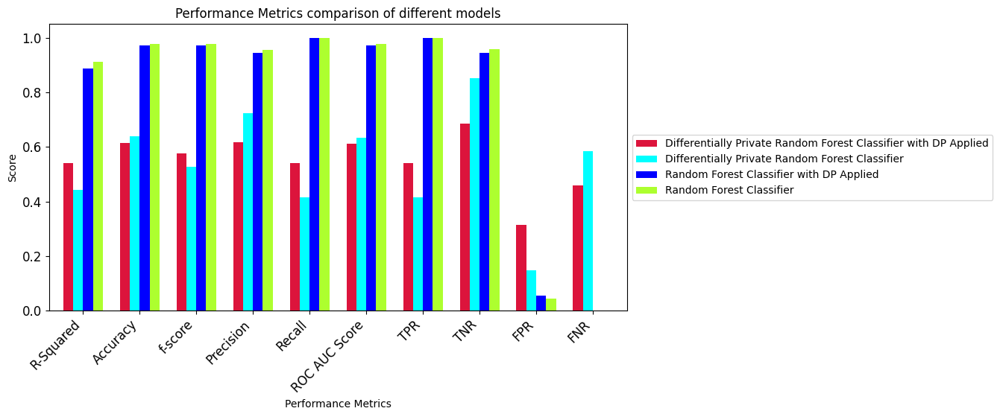

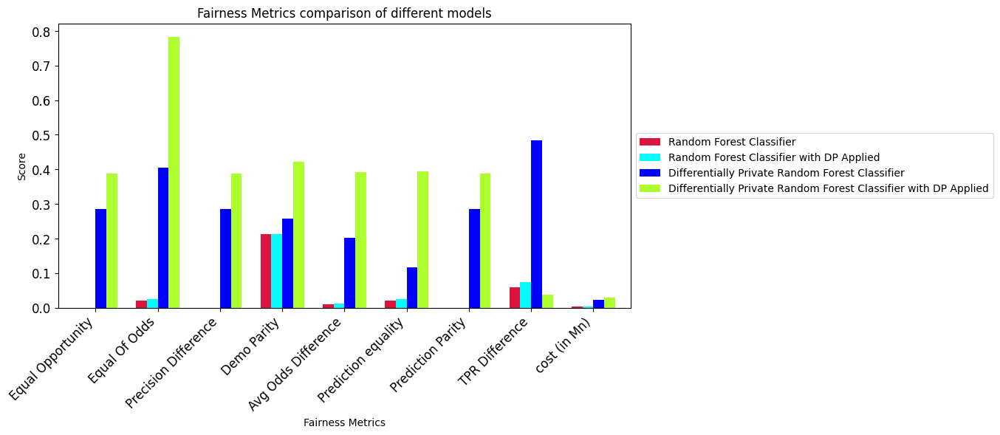

In [36]:
df_index = 0
df_performance_compare = pd.DataFrame(columns=evaluate_columns)
df_fairness_compare = pd.DataFrame(columns=fairness_matrics_columns)


## Apply Random Forest model

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test

RFmodel = ensemble.RandomForestClassifier()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Random Forest Classifier")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Random Forest Classifier",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply model with differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test

RFmodel = ensemble.RandomForestClassifier()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Random Forest Classifier with DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Random Forest Classifier with DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1



## Apply differential privacy Random Forest model

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test

RFmodel = diffprivlib.models.RandomForestClassifier()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Differentially Private Random Forest Classifier")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Random Forest Classifier",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply Differentially Private model with differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test

RFmodel = diffprivlib.models.RandomForestClassifier()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Differentially Private Random Forest Classifier with DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Random Forest Classifier with DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1

df_performance_compare.head()
df_performance_compare_random_forest = df_performance_compare
df_fairness_compare_random_forest = df_fairness_compare

draw_df_compare_graph(df_performance_compare, graph_title="Performance Metrics")
draw_df_compare_graph(df_fairness_compare, graph_title="Fairness Metrics")

### Logistic Regression

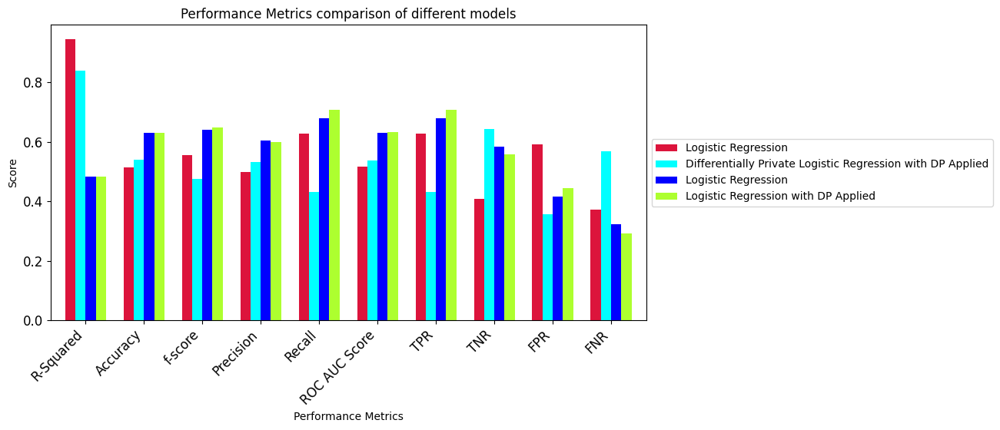

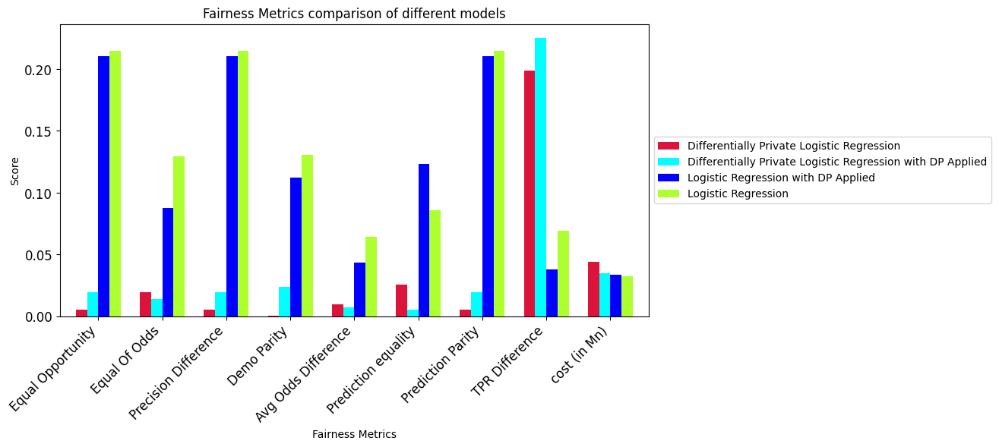

In [37]:
df_index = 0
df_performance_compare = pd.DataFrame(columns=evaluate_columns)
df_fairness_compare = pd.DataFrame(columns=fairness_matrics_columns)


## Apply Logistic Regression model

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test

RFmodel = LogisticRegression()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Logistic Regression")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Logistic Regression",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply model with differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test

RFmodel = LogisticRegression()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Logistic Regression with DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Logistic Regression with DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply differential privacy Logistic Regression model

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test

RFmodel = diffprivlib.models.LogisticRegression()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Logistic Regression")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Logistic Regression",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply Differentially Private model with differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test

RFmodel = diffprivlib.models.LogisticRegression()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Differentially Private Logistic Regression with DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Logistic Regression with DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1



df_performance_compare.head()

df_performance_compare_logistic = df_performance_compare
df_fairness_compare_logistic = df_fairness_compare


draw_df_compare_graph(df_performance_compare, graph_title="Performance Metrics")
draw_df_compare_graph(df_fairness_compare, graph_title="Fairness Metrics")

From the above dataframe df_comapre, we can see that applying differential privacy with epsilon 0.3 has very little effect on model metrics. Which means the epsilon selected is appropriate with respect to the privacy considerations.

## Reweighting

In [38]:
X_train_dp.columns


Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'HourlyRate', 'IdealEmployee',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'undervaluedEmp',
       'BusinessTravel_Travel_Frequently', 'BusinessTravel_Travel_Rarely',
       'Department_Research & Development', 'Department_Sales',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'EducationField_Technical Degree', 'Gender_Male',
       'JobRole_Human Resources', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Res

### SPD

Attrition_en            0    1
MaritalStatus_Single          
0                     187  128
1                      68  111
SPD for MaritalStatus_Single: 0.21376252549436903 
Disparate impact for MaritalStatus_Single: 1.5260562150837989


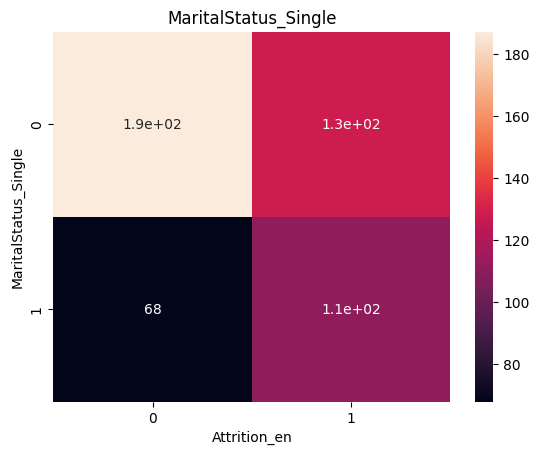

In [39]:

def find_spd_for_discrimation_columns(discrimation_columns, X_test, y_test):
    for i in discrimation_columns:
        df_heatmap = pd.crosstab(X_test[i], y_test)
        plt.figure()
        sns.heatmap(
            data=df_heatmap, annot=True, annot_kws={"ha": "center", "va": "center"}
        )
        plt.title(i)

        print(df_heatmap)

        spd = (df_heatmap[1][1] / (df_heatmap[1][1] + df_heatmap[0][1])) - (
            df_heatmap[1][0] / (df_heatmap[1][0] + df_heatmap[0][0])
        )

        di = (df_heatmap[1][1] / (df_heatmap[1][1] + df_heatmap[0][1])) / (
            df_heatmap[1][0] / (df_heatmap[1][0] + df_heatmap[0][0])
        )
        print(f"SPD for {i}: {abs(spd)} \nDisparate impact for {i}: {abs(di)}")
        plt.show()


find_spd_for_discrimation_columns(discrimation_columns, X_test, y_test)


So we see that there is Statistical parity difference in MaritalStatus column, specifically for 'Single' category.

So we will use reweighting on MaritalStatus column

### Reweights

In [40]:
def find_reweights_and_new_weights_column(column_name, X_train, y_train):
    heatmapPivot = pd.crosstab(X_test[column_name], y_test)

    # first is column nad 2nd is result
    # e.g n_0_1 column is 0 and result is 1
    n_0_0 = heatmapPivot[0][0]
    n_1_0 = heatmapPivot[0][1]
    n_0_1 = heatmapPivot[1][0]
    n_1_1 = heatmapPivot[1][1]

    n = n_0_0 + n_1_0 + n_0_1 + n_1_1

    w_0_0 = ((n_0_0 + n_1_0) * (n_0_0 + n_0_1)) / (  # y = 0  # s = 0
        n_0_0 * n  # y = 0 and s = 0
    )

    w_1_0 = ((n_0_0 + n_1_0) * (n_1_0 + n_1_1)) / (  # y = 0  # s = 1
        n_1_0 * n  # y = 0 and s = 1
    )

    w_0_1 = ((n_0_1 + n_1_1) * (n_0_0 + n_0_1)) / (  # y = 1  # s = 0
        n_0_1 * n  # y = 1 and s = 0
    )

    w_1_1 = ((n_0_1 + n_1_1) * (n_1_0 + n_1_1)) / (  # y = 1  # s = 1
        n_1_1 * n  # y = 1 and s = 1
    )

    print(f"weights are {w_0_0}, {w_1_0}, {w_0_1}, {w_1_1}")

    # w1 = (341 * 418) / (340 * 422)
    # w2 = (82 * 418) / (78 * 422)
    # w3 = (341 * 5) / (1 * 422)
    # w4 = (82 * 5) / (4 * 422)

    # print(f"weights are {w1}, {w2}, {w3}, {w4}")

    result_dataset = X_train.copy()
    result_dataset["Weights"] = 999

    result_dataset.loc[
        (result_dataset[column_name] == 0) & (y_train == 0), "Weights"
    ] = w_0_0
    result_dataset.loc[
        (result_dataset[column_name] == 0) & (y_train == 1), "Weights"
    ] = w_0_1
    result_dataset.loc[
        (result_dataset[column_name] == 1) & (y_train == 0), "Weights"
    ] = w_1_0
    result_dataset.loc[
        (result_dataset[column_name] == 1) & (y_train == 1), "Weights"
    ] = w_1_1

    return result_dataset["Weights"]

single_discrimation_column = discrimation_columns[0]
find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=y_train
)


weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854


328     1.358806
566     0.780191
1570    1.190616
780     0.780191
541     0.869525
          ...   
279     0.869525
2041    1.190616
664     0.869525
1318    0.869525
723     0.869525
Name: Weights, Length: 1972, dtype: float64

### Random Forest

weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854
weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854
weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854
weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854


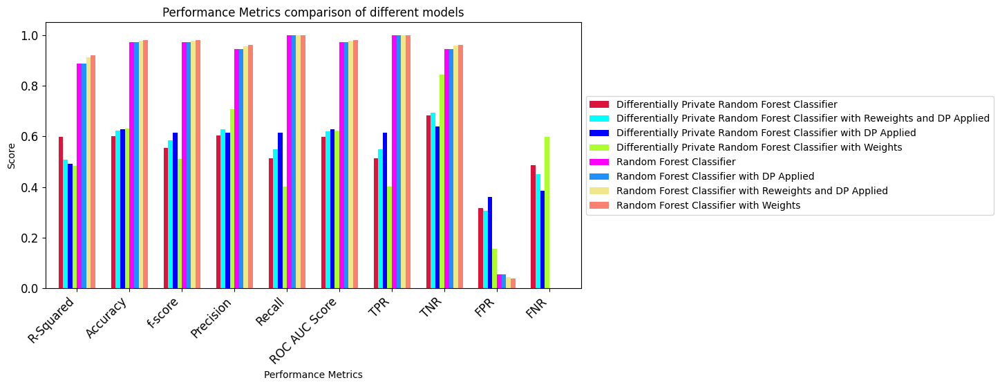

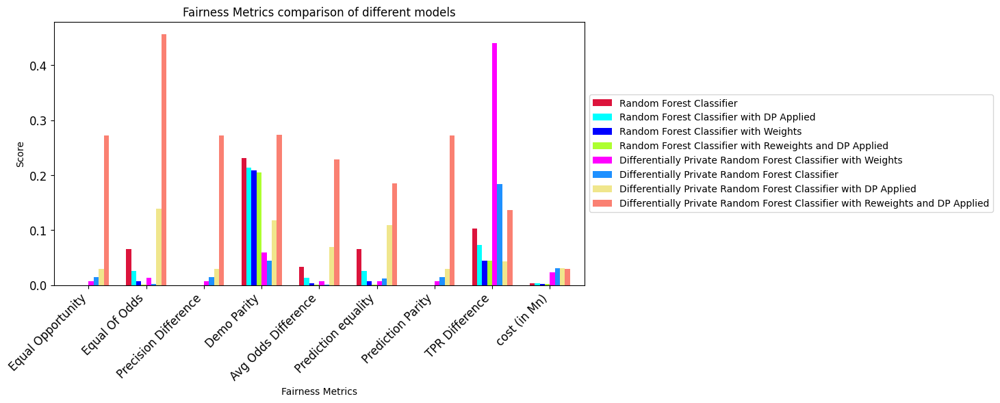

In [41]:
df_index = 0
df_performance_compare = pd.DataFrame(columns=evaluate_columns)
df_fairness_compare = pd.DataFrame(columns=fairness_matrics_columns)


## Apply Random Forest model

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test

RFmodel = ensemble.RandomForestClassifier()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Random Forest Classifier")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Random Forest Classifier",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply model with differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test

RFmodel = ensemble.RandomForestClassifier()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Random Forest Classifier with DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Random Forest Classifier with DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply model with Reweights

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = ensemble.RandomForestClassifier()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Random Forest Classifier with Weights"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Random Forest Classifier with Weights",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply model with Reweights and differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = ensemble.RandomForestClassifier()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Random Forest Classifier with Reweights and DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Random Forest Classifier with Reweights and DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply differential privacy Random Forest model

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test

RFmodel = diffprivlib.models.RandomForestClassifier()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Differentially Private Random Forest Classifier")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Random Forest Classifier",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply Differentially Private model with differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test

RFmodel = diffprivlib.models.RandomForestClassifier()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Differentially Private Random Forest Classifier with DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Random Forest Classifier with DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply Differentially Private with Reweights

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = diffprivlib.models.RandomForestClassifier()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Differentially Private Random Forest Classifier with Weights"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Random Forest Classifier with Weights",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply Differentially Private model with Reweights and differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = diffprivlib.models.RandomForestClassifier()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Differentially Private Random Forest Classifier with Reweights and DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Random Forest Classifier with Reweights and DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


df_performance_compare.head()

df_all_models_compare_performance_metrics = pd.concat(
    [df_all_models_compare_performance_metrics, df_performance_compare]
)
df_all_models_compare_fairness_metrics = pd.concat(
    [df_all_models_compare_fairness_metrics, df_fairness_compare]
)

draw_df_compare_graph(df_performance_compare, graph_title="Performance Metrics")
draw_df_compare_graph(df_fairness_compare, graph_title="Fairness Metrics")

### Logistic Regression

weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854
weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854
weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854
weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854


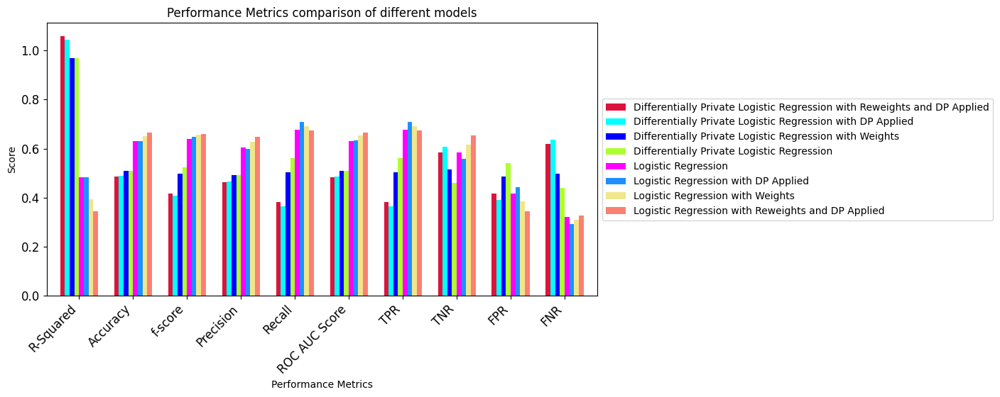

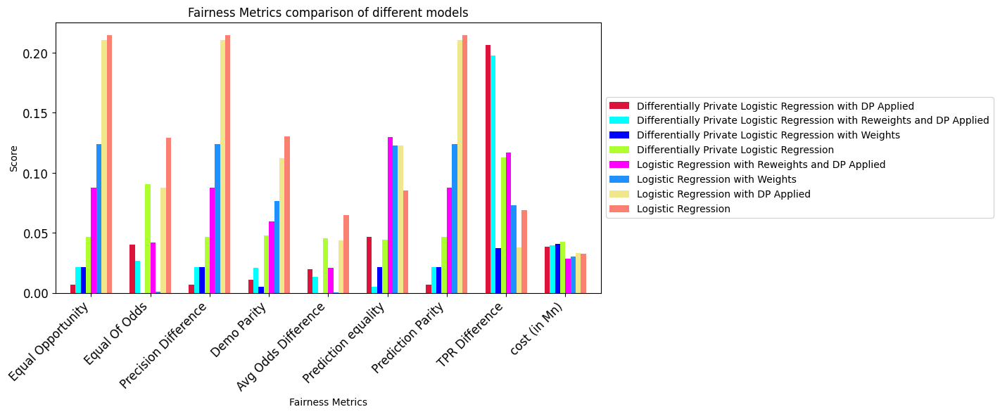

In [42]:
df_index = 0
df_performance_compare = pd.DataFrame(columns=evaluate_columns)
df_fairness_compare = pd.DataFrame(columns=fairness_matrics_columns)


## Apply Logistic Regression model

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test

RFmodel = LogisticRegression()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Logistic Regression")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Logistic Regression",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply model with differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test

RFmodel = LogisticRegression()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Logistic Regression with DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Logistic Regression with DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply model with Reweights

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = LogisticRegression()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Logistic Regression with Weights"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Logistic Regression with Weights",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply model with Reweights and differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = LogisticRegression()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Logistic Regression with Reweights and DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Logistic Regression with Reweights and DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply differential privacy Logistic Regression model

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test

RFmodel = diffprivlib.models.LogisticRegression()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Differentially Private Logistic Regression")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Logistic Regression",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply Differentially Private model with differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test

RFmodel = diffprivlib.models.LogisticRegression()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Differentially Private Logistic Regression with DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Logistic Regression with DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply Differentially Private with Reweights

train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = diffprivlib.models.LogisticRegression()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Differentially Private Logistic Regression with Weights"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Logistic Regression with Weights",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


## Apply Differentially Private model with Reweights and differential privacy applied on data

train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = diffprivlib.models.LogisticRegression()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(
    test_y, pred_rf, "Differentially Private Logistic Regression with Reweights and DP Applied"
)
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Differentially Private Logistic Regression with Reweights and DP Applied",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1

df_performance_compare.head()


df_all_models_compare_performance_metrics = pd.concat(
    [df_all_models_compare_performance_metrics, df_performance_compare]
)
df_all_models_compare_fairness_metrics = pd.concat(
    [df_all_models_compare_fairness_metrics, df_fairness_compare]
)


draw_df_compare_graph(df_performance_compare, graph_title="Performance Metrics")
draw_df_compare_graph(df_fairness_compare, graph_title="Fairness Metrics")

## ACF- Additive counterfactual fairness metric

In [43]:
class ACF:
    def __init__(
        self, acf_removal_columns, acf_prediction_columns, df, acf_model="linear"
    ):
        self.acf_removal_columns = acf_removal_columns
        self.acf_prediction_columns = acf_prediction_columns
        self.acf_model = acf_model
        self.df = df

        self.col_models = {}

        for i in self.acf_prediction_columns:
            if acf_model == "linear":
                self.col_models[i] = LinearRegression().fit(
                    self.df[self.acf_removal_columns], self.df[i]
                )
            if acf_model == "logistic":
                self.col_models[i] = LogisticRegression().fit(
                    self.df[self.acf_removal_columns], self.df[i]
                )

    def predict(self, df):
        df = df.copy()
        for i in self.acf_prediction_columns:
            df[i] = df[i] - self.col_models[i].predict(df[self.acf_removal_columns])
        return df[self.acf_prediction_columns]


acf_removal_columns = discrimation_columns
acf_prediction_columns = numericalCol

X_train_acf_data = X_train.copy()
X_test_acf_data = X_test.copy()
# acf_data = pd.get_dummies(acf_data, drop_first=False)
acf_model = "linear"


acf_model = ACF(acf_removal_columns, acf_prediction_columns, X_train_acf_data, acf_model)
X_train_acf_data[acf_prediction_columns] = acf_model.predict(X_train_acf_data)
X_test_acf_data[acf_prediction_columns] = acf_model.predict(X_test_acf_data)
X_test_acf_data



X_train_acf_data = X_train_acf_data.copy()
X_test_acf_data = X_test_acf_data.copy()
acf_removal_columns = discrimation_columns
acf_prediction_columns = categoricalCol
# acf_data = pd.get_dummies(acf_data, drop_first=False)
acf_model = "logistic"


acf_model = ACF(acf_removal_columns, acf_prediction_columns, X_train_acf_data, acf_model)
X_train_acf_data[acf_prediction_columns] = acf_model.predict(X_train_acf_data)
X_test_acf_data[acf_prediction_columns] = acf_model.predict(X_test_acf_data)
X_train_acf_data

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,IdealEmployee,JobInvolvement,JobLevel,JobSatisfaction,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
328,33,-251.818182,0.041558,0.177922,-0.584416,-20.284416,0,-0.570130,2,1.390909,...,0,0,0,0,0,1,0,0,1,0
566,47,-40.818182,17.041558,-0.822078,-0.584416,10.715584,0,1.429870,2,0.390909,...,0,0,0,0,0,1,0,0,1,1
1570,31,-266.825291,10.079867,0.078203,-0.608985,5.381032,0,-1.700499,2,0.327787,...,0,0,0,0,0,1,0,1,0,1
780,28,606.181818,14.041558,-0.822078,-0.584416,5.715584,0,-0.570130,3,-1.609091,...,0,0,0,0,0,0,0,0,1,0
541,36,-381.825291,-1.920133,0.078203,-1.608985,-2.618968,0,1.299501,3,-1.672213,...,0,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279,50,-11.825291,-5.920133,-1.921797,-1.608985,30.381032,0,0.299501,5,-0.672213,...,0,0,0,1,0,0,0,0,0,0
2041,41,551.174709,2.079867,0.078203,-0.608985,-16.618968,0,0.299501,5,0.327787,...,0,0,0,1,0,0,0,1,0,0
664,36,616.174709,4.079867,-1.921797,0.391015,2.381032,0,0.299501,2,1.327787,...,0,0,0,0,0,0,0,1,0,1
1318,29,-234.825291,10.079867,-1.921797,1.391015,-25.618968,0,0.299501,1,1.327787,...,1,0,0,0,0,0,0,1,0,0


### Random Forest

weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854


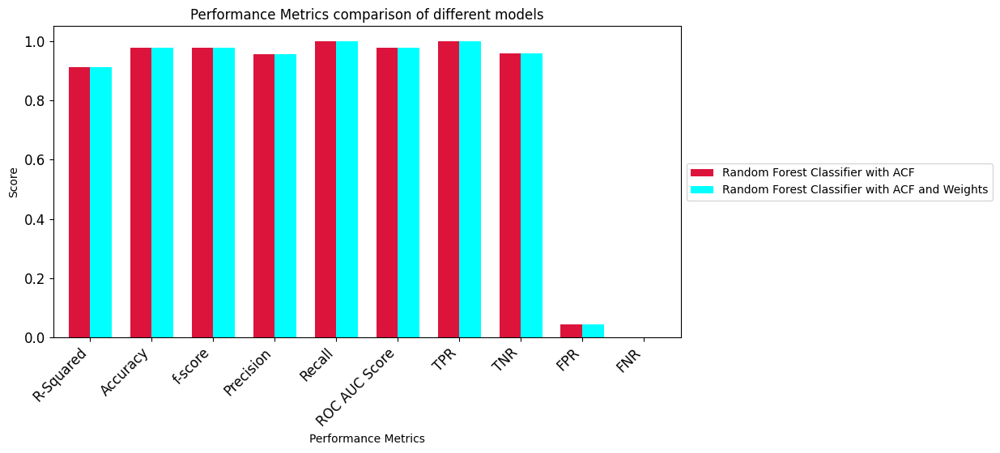

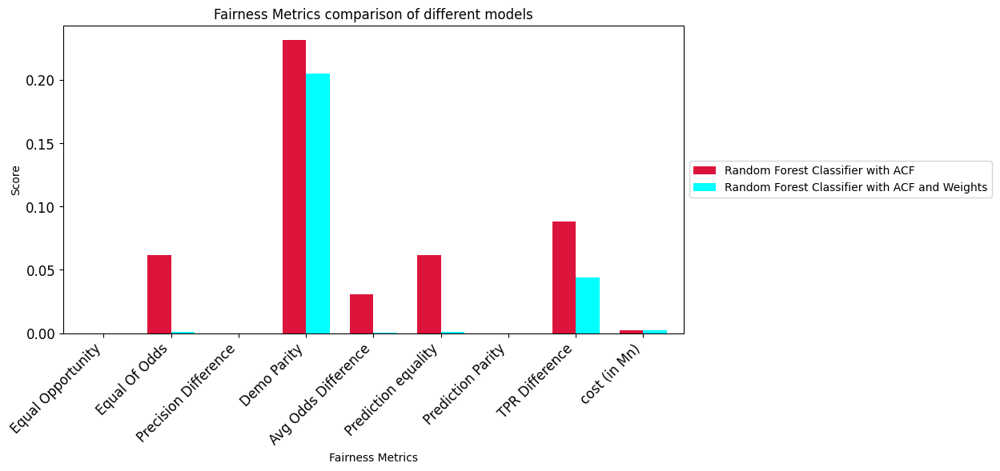

In [44]:
df_index = 0
df_performance_compare = pd.DataFrame(columns=evaluate_columns)
df_fairness_compare = pd.DataFrame(columns=fairness_matrics_columns)



train_x = X_train_acf_data[nonPiiCol]
train_y = y_train
test_x = X_test_acf_data[nonPiiCol]
test_y = y_test

RFmodel = ensemble.RandomForestClassifier()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Random Forest Classifier with ACF")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test_acf_data,
    test_y,
    pred_rf,
    method="Random Forest Classifier with ACF",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1





train_x = X_train_acf_data[nonPiiCol]
train_y = y_train
test_x = X_test_acf_data[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = ensemble.RandomForestClassifier()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)
pred_rf = RFmodel.predict(test_x)


df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Random Forest Classifier with ACF and Weights")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test_acf_data,
    test_y,
    pred_rf,
    method="Random Forest Classifier with ACF and Weights",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


df_all_models_compare_performance_metrics = pd.concat(
    [df_all_models_compare_performance_metrics, df_performance_compare]
)
df_all_models_compare_fairness_metrics = pd.concat(
    [df_all_models_compare_fairness_metrics, df_fairness_compare]
)


draw_df_compare_graph(df_performance_compare, graph_title="Performance Metrics")
draw_df_compare_graph(df_fairness_compare, graph_title="Fairness Metrics")


### Logistic Regression

weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854


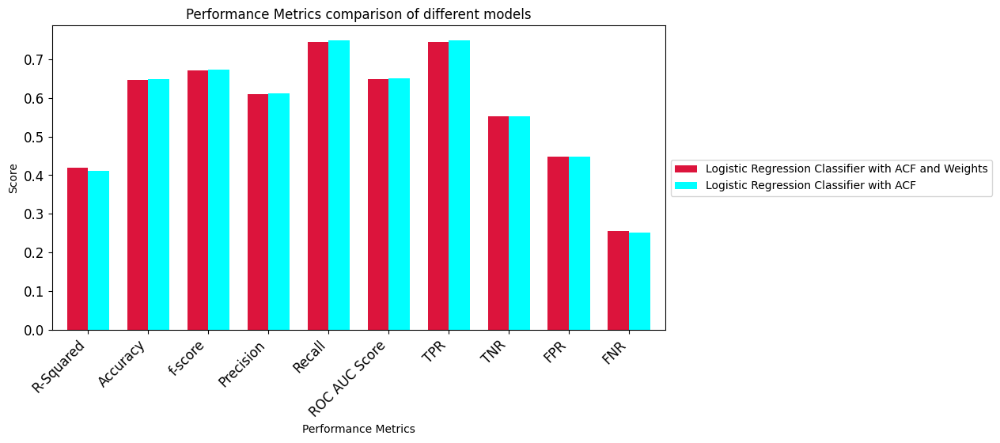

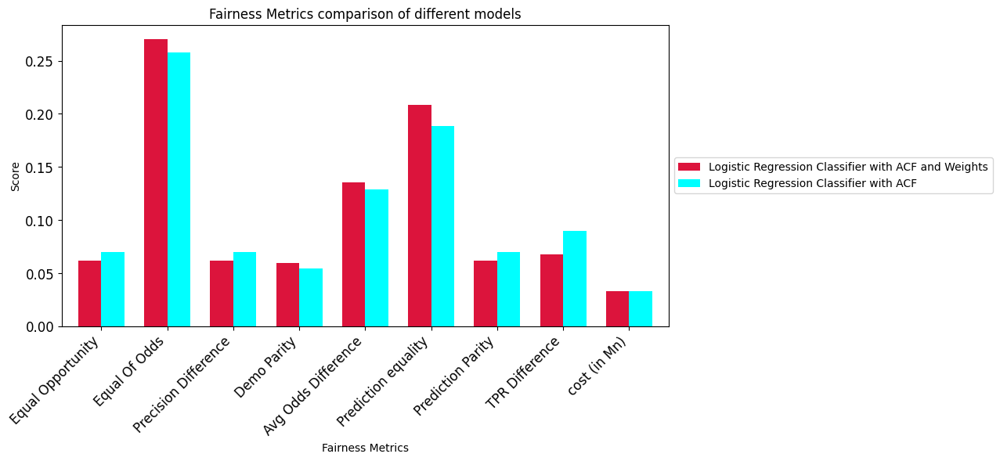

In [45]:
df_index = 0
df_performance_compare = pd.DataFrame(columns=evaluate_columns)
df_fairness_compare = pd.DataFrame(columns=fairness_matrics_columns)


# train_x = X_train[nonPiiCol]
# train_y = y_train
# test_x = X_test[nonPiiCol]
# test_y = y_test

# RFmodel = LogisticRegression()
# RFmodel.fit(train_x, train_y)
# pred_rf = RFmodel.predict(test_x)

# df_compare.loc[df_index] = evaluate_fairness_matrics(
#     X_test,
#     test_y,
#     pred_rf,
#     method="Logistic Regression Classifier",
#     fairness_column=single_discrimation_column,
# )
# df_index = df_index + 1





# train_x = X_train[nonPiiCol]
# train_y = y_train
# test_x = X_test[nonPiiCol]
# test_y = y_test
# train_x_weights = find_reweights_and_new_weights_column(
#     column_name=single_discrimation_column, X_train=X_train_acf_data, y_train=train_y
# )

# RFmodel = LogisticRegression()
# RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)
# pred_rf = RFmodel.predict(test_x)

# df_compare.loc[df_index] = evaluate_fairness_matrics(
#     X_test,
#     test_y,
#     pred_rf,
#     method="Logistic Regression Classifier with Weights",
#     fairness_column=single_discrimation_column,
# )
# df_index = df_index + 1





train_x = X_train_acf_data[nonPiiCol]
train_y = y_train
test_x = X_test_acf_data[nonPiiCol]
test_y = y_test

RFmodel = LogisticRegression()
RFmodel.fit(train_x, train_y)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Logistic Regression Classifier with ACF")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test_acf_data,
    test_y,
    pred_rf,
    method="Logistic Regression Classifier with ACF",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1





train_x = X_train_acf_data[nonPiiCol]
train_y = y_train
test_x = X_test_acf_data[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train_acf_data, y_train=train_y
)

RFmodel = LogisticRegression()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)
pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Logistic Regression Classifier with ACF and Weights")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test_acf_data,
    test_y,
    pred_rf,
    method="Logistic Regression Classifier with ACF and Weights",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1


df_all_models_compare_performance_metrics = pd.concat(
    [df_all_models_compare_performance_metrics, df_performance_compare]
)
df_all_models_compare_fairness_metrics = pd.concat(
    [df_all_models_compare_fairness_metrics, df_fairness_compare]
)

draw_df_compare_graph(df_performance_compare, graph_title="Performance Metrics")
draw_df_compare_graph(df_fairness_compare, graph_title="Fairness Metrics")

## Selecting the best model

In [102]:
df_all_models_compare_performance_metrics

,Method,R-Squared,Accuracy,f-score,Precision,Recall,ROC AUC Score,TPR,TNR,FPR,FNR
2,Random Forest Classifier with Weights,0.918943,0.979757,0.979508,0.959839,1.000000,0.980392,1.000000,0.960784,0.039216,0.000000
3,Random Forest Classifier with Reweights and DP...,0.910838,0.977733,0.977505,0.956000,1.000000,0.978431,1.000000,0.956863,0.043137,0.000000
0,Random Forest Classifier with ACF,0.910838,0.977733,0.977505,0.956000,1.000000,0.978431,1.000000,0.956863,0.043137,0.000000
1,Random Forest Classifier with ACF and Weights,0.910838,0.977733,0.977505,0.956000,1.000000,0.978431,1.000000,0.956863,0.043137,0.000000
0,Random Forest Classifier,0.886521,0.971660,0.971545,0.944664,1.000000,0.972549,1.000000,0.945098,0.054902,0.000000
1,Random Forest Classifier with DP Applied,0.886521,0.971660,0.971545,0.944664,1.000000,0.972549,1.000000,0.945098,0.054902,0.000000
0,Logistic Regression Classifier with ACF,0.410386,0.647773,0.672932,0.610922,0.748954,0.650948,0.748954,0.552941,0.447059,0.251046
1,Logistic Regression Classifier with ACF and We...,0.418492,0.645749,0.670433,0.609589,0.744770,0.648856,0.744770,0.552941,0.447059,0.255230
3,Logistic Regression with Reweights and DP Applied,0.345541,0.663968,0.659836,0.646586,0.673640,0.664271,0.673640,0.654902,0.345098,0.326360
2,Logistic Regression with Weights,0.394175,0.651822,0.657371,0.627376,0.690377,0.653031,0.690377,0.615686,0.384314,0.309623


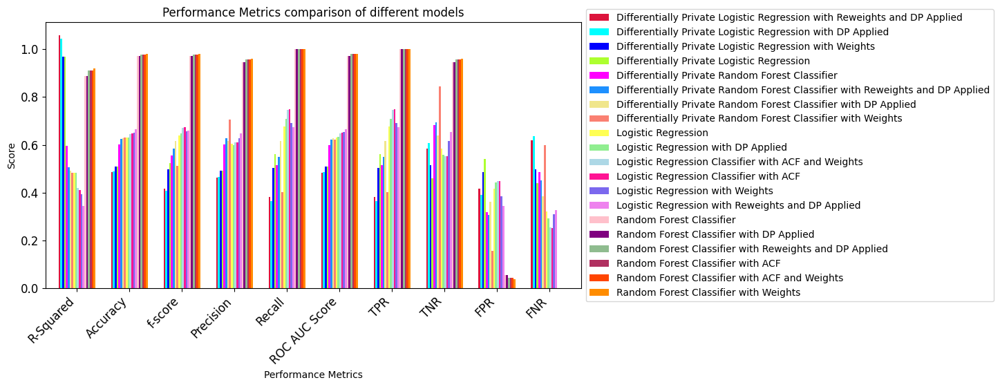

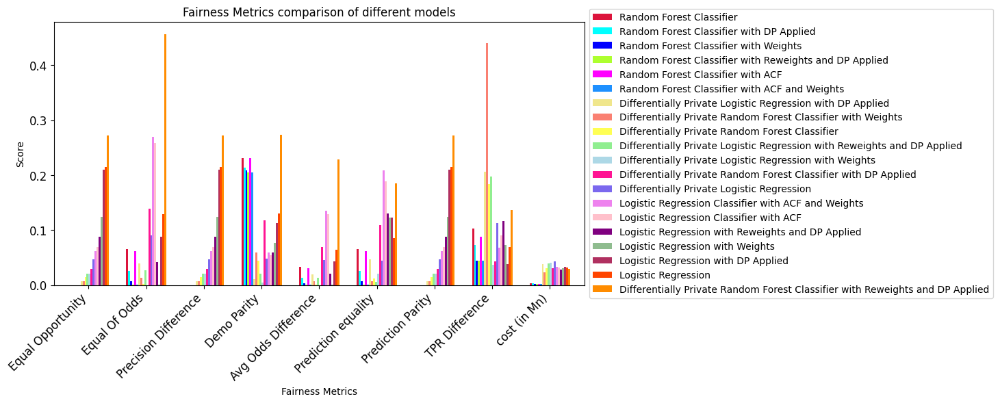

In [46]:
draw_df_compare_graph(df_all_models_compare_performance_metrics, graph_title="Performance Metrics")
draw_df_compare_graph(df_all_models_compare_fairness_metrics, graph_title="Fairness Metrics")

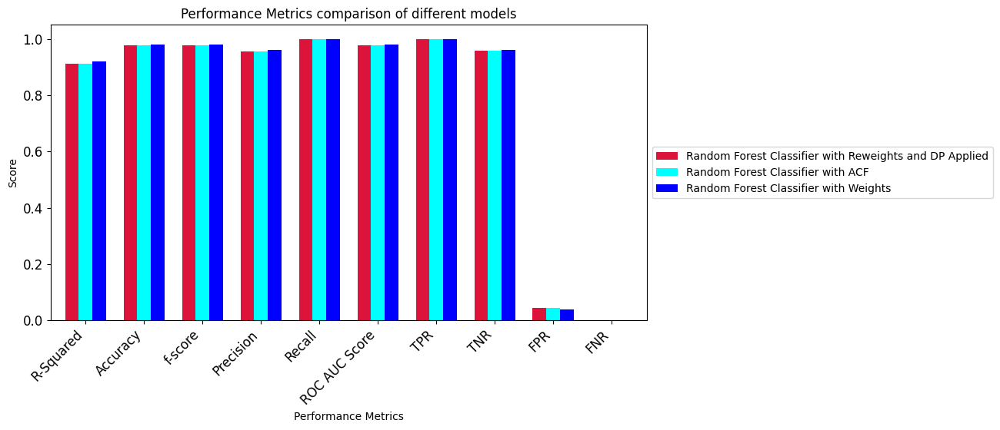

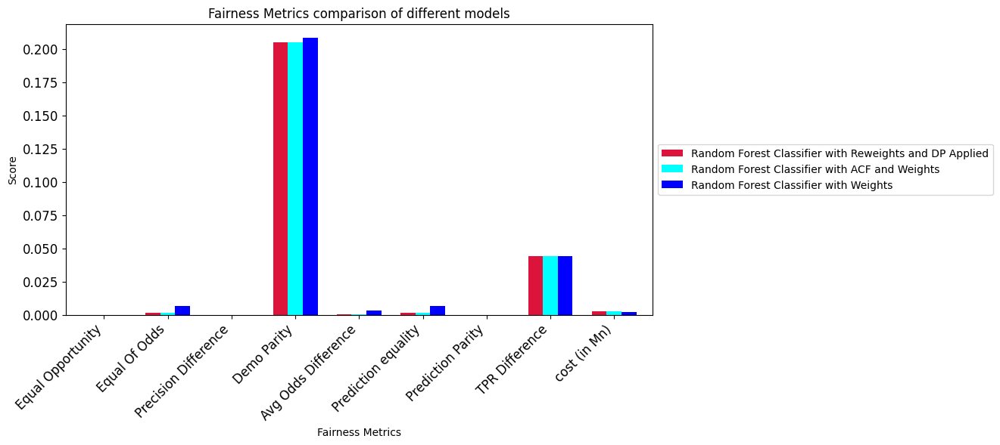

In [56]:
df_all_models_compare_performance_metrics = df_all_models_compare_performance_metrics.sort_values(by=['f-score', 'Accuracy'], ascending=False)
df_all_models_compare_fairness_metrics = df_all_models_compare_fairness_metrics.sort_values(by=['Equal Opportunity','Equal Of Odds'])

draw_df_compare_graph(df_all_models_compare_performance_metrics.iloc[:3, :], graph_title="Performance Metrics")
draw_df_compare_graph(df_all_models_compare_fairness_metrics.iloc[:3, :], graph_title="Fairness Metrics")


In [57]:
# not being printed
df_all_models_compare_performance_metrics

,Method,R-Squared,Accuracy,f-score,Precision,Recall,ROC AUC Score,TPR,TNR,FPR,FNR
2,Random Forest Classifier with Weights,0.918943,0.979757,0.979508,0.959839,1.000000,0.980392,1.000000,0.960784,0.039216,0.000000
3,Random Forest Classifier with Reweights and DP...,0.910838,0.977733,0.977505,0.956000,1.000000,0.978431,1.000000,0.956863,0.043137,0.000000
0,Random Forest Classifier with ACF,0.910838,0.977733,0.977505,0.956000,1.000000,0.978431,1.000000,0.956863,0.043137,0.000000
1,Random Forest Classifier with ACF and Weights,0.910838,0.977733,0.977505,0.956000,1.000000,0.978431,1.000000,0.956863,0.043137,0.000000
0,Random Forest Classifier,0.886521,0.971660,0.971545,0.944664,1.000000,0.972549,1.000000,0.945098,0.054902,0.000000
1,Random Forest Classifier with DP Applied,0.886521,0.971660,0.971545,0.944664,1.000000,0.972549,1.000000,0.945098,0.054902,0.000000
0,Logistic Regression Classifier with ACF,0.410386,0.647773,0.672932,0.610922,0.748954,0.650948,0.748954,0.552941,0.447059,0.251046
1,Logistic Regression Classifier with ACF and We...,0.418492,0.645749,0.670433,0.609589,0.744770,0.648856,0.744770,0.552941,0.447059,0.255230
3,Logistic Regression with Reweights and DP Applied,0.345541,0.663968,0.659836,0.646586,0.673640,0.664271,0.673640,0.654902,0.345098,0.326360
2,Logistic Regression with Weights,0.394175,0.651822,0.657371,0.627376,0.690377,0.653031,0.690377,0.615686,0.384314,0.309623


In [101]:
DeepnoteChart(df_all_models_compare_performance_metrics, """{"mark":{"type":"bar","tooltip":true},"width":"container","height":"container","$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{"x":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear"}},"y":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear"}},"color":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear"}}}}""")

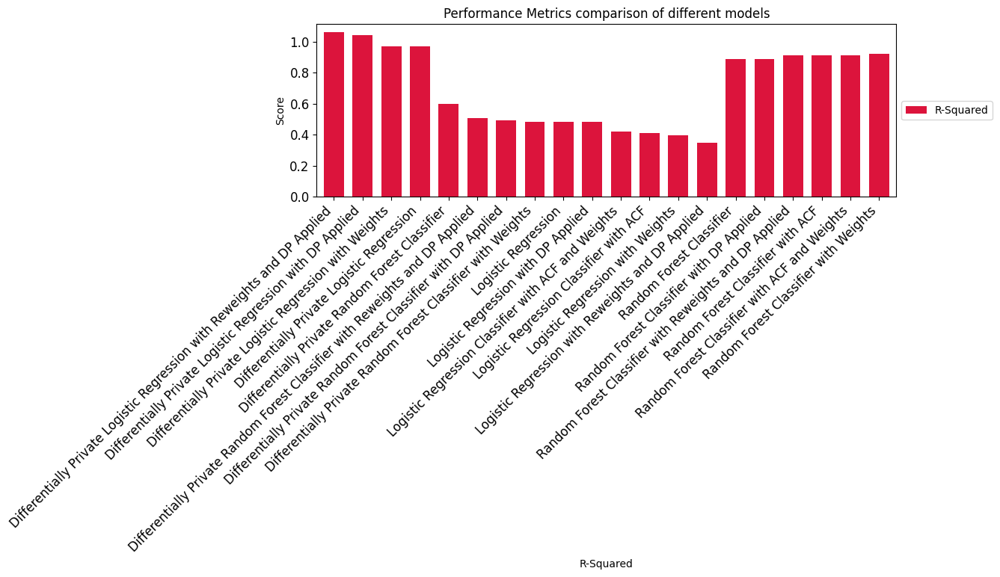

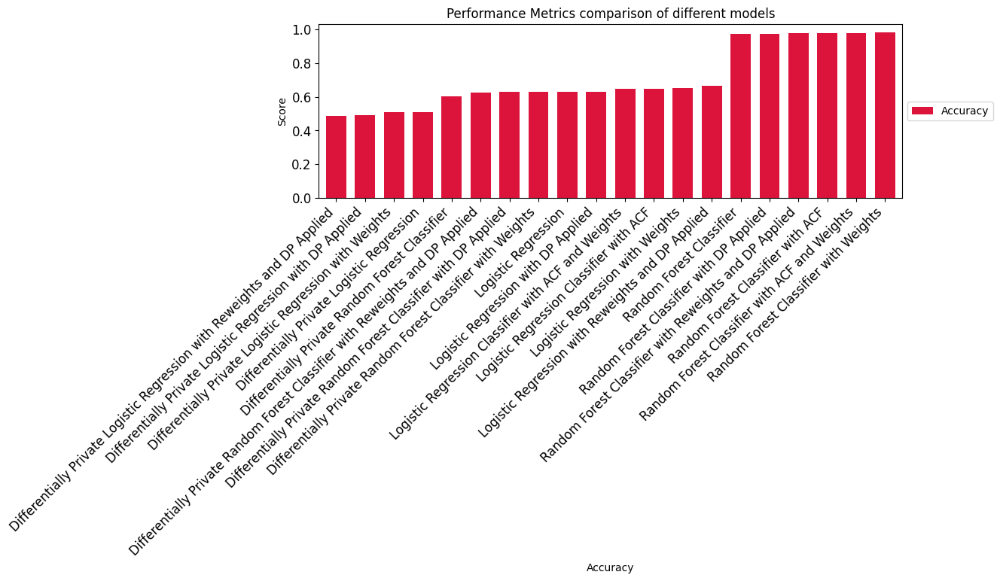

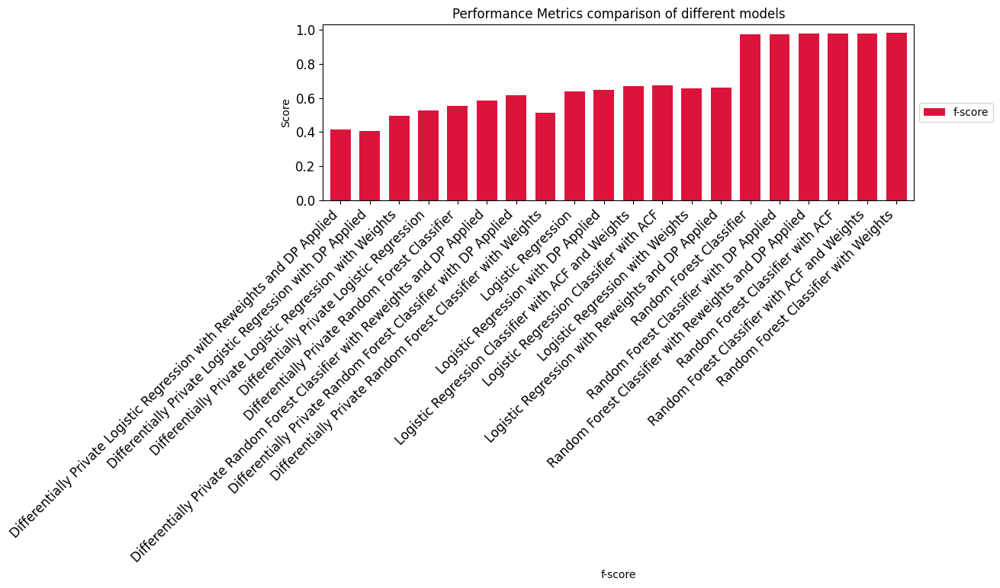

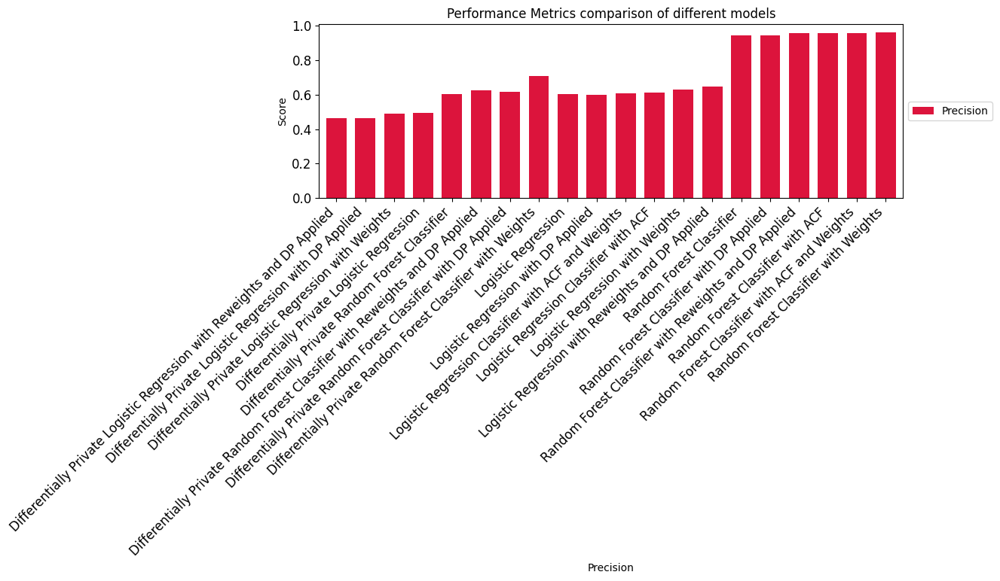

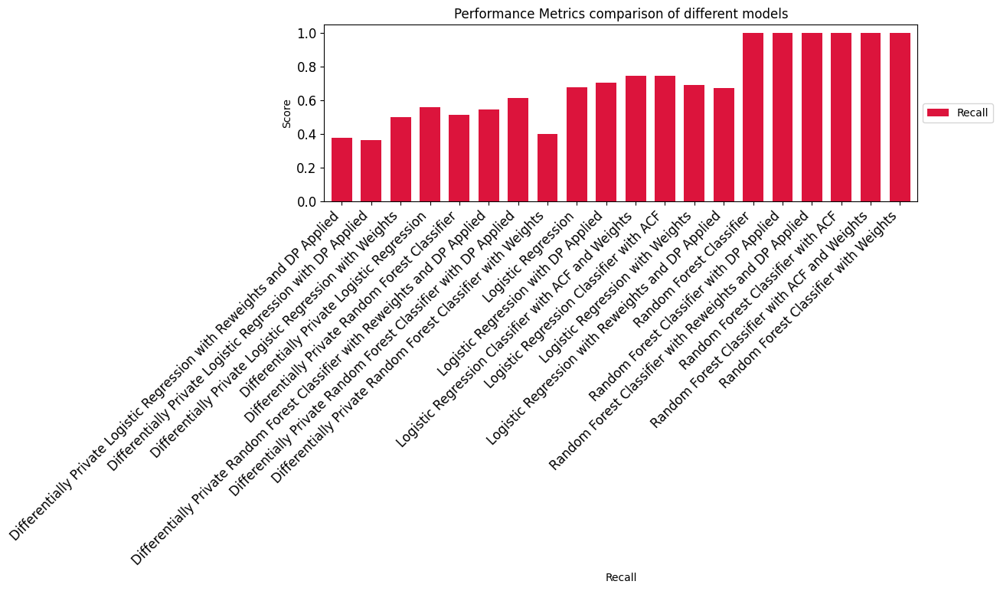

...

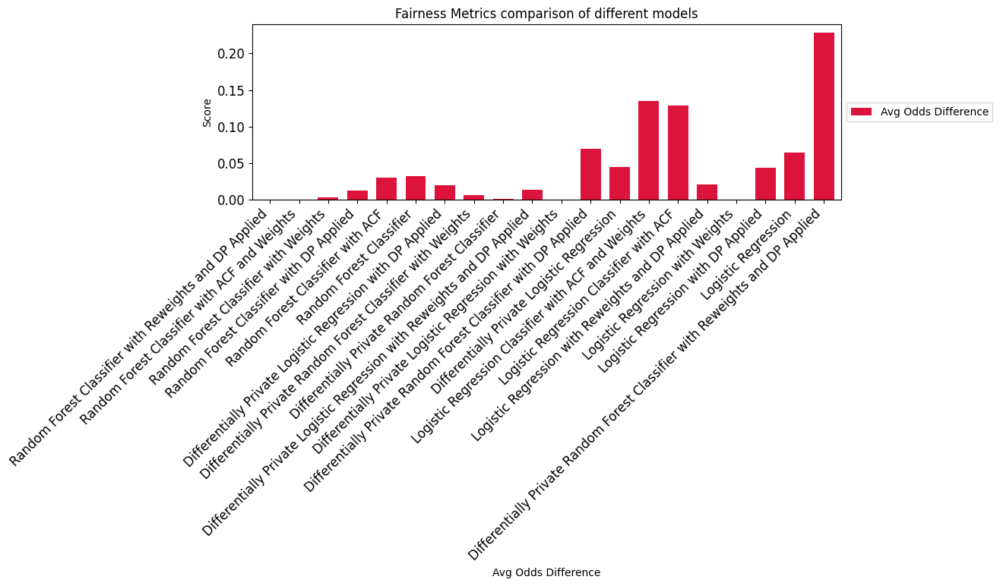

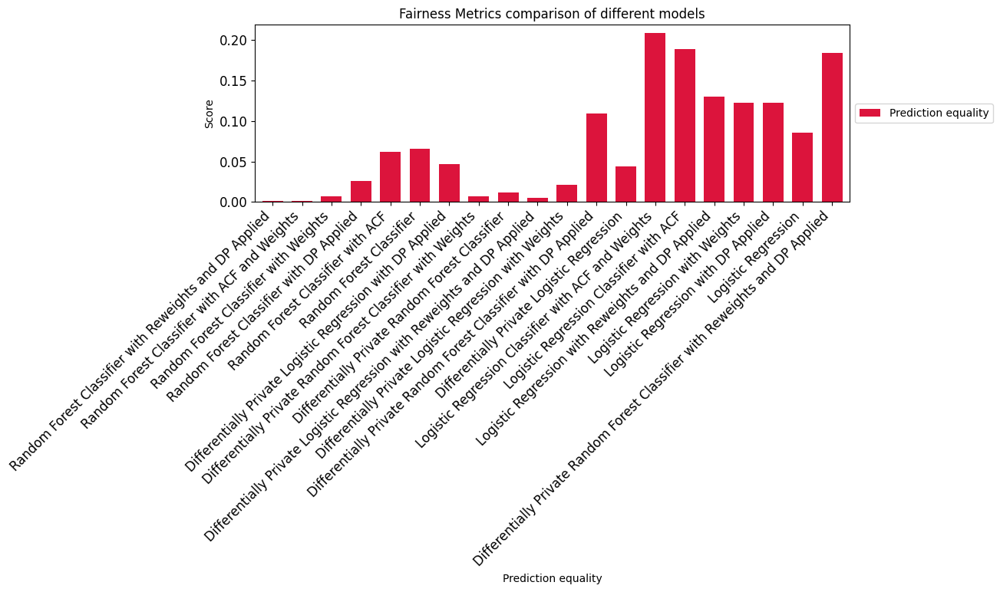

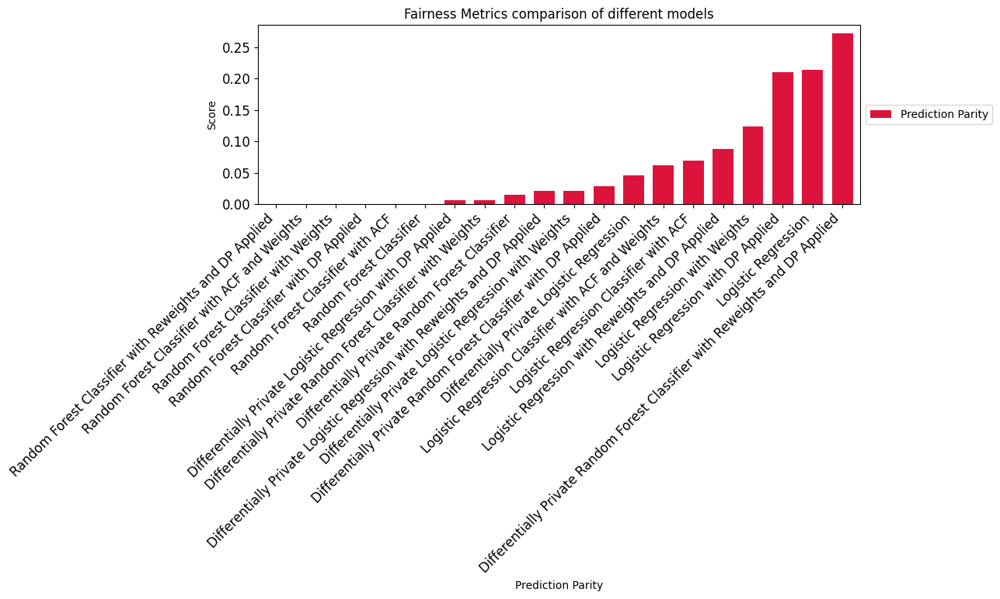

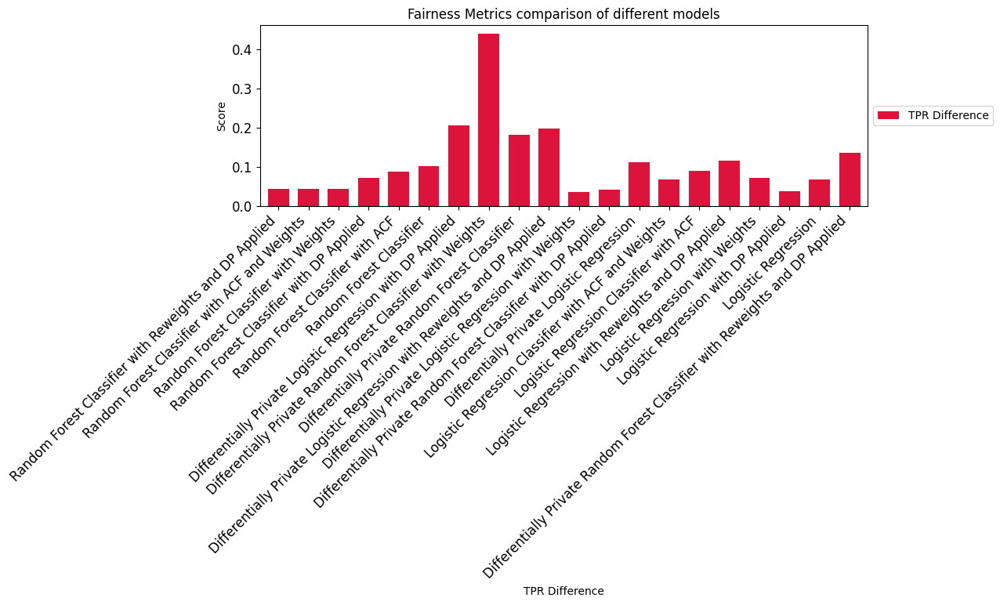

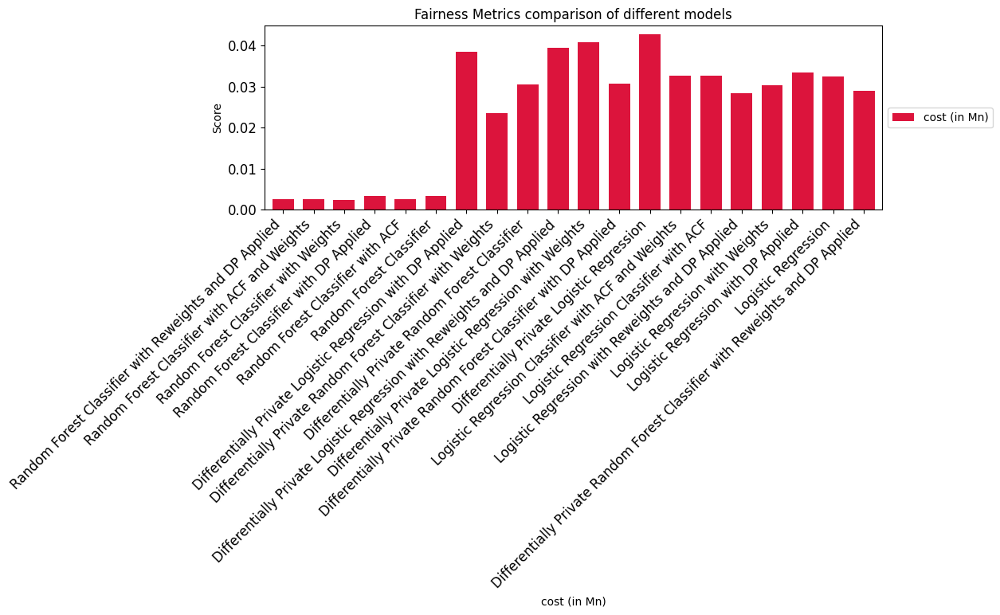

In [58]:
draw_df_compare_graph_for_each_metric(df_all_models_compare_performance_metrics, graph_title="Performance Metrics")
draw_df_compare_graph_for_each_metric(df_all_models_compare_fairness_metrics, graph_title="Fairness Metrics")

## XAI

### SHAP

In [59]:
train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = ensemble.RandomForestClassifier()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)

shap_explainer = shap.Explainer(RFmodel.predict, test_x)
shap_values = shap_explainer(test_x)


weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854
Permutation explainer: 495it [03:30,  2.28it/s]


In [60]:
# shap.summary_plot(shap_values)

In [61]:
# shap.initjs()
# shap.plots.force(shap_values[0])

### Qunatile Split

In [93]:
def ret_tag(val, categories, tags):
    for i in range(len(tags)):
        if val in categories[i]:
            return tags[i]
        
def zero_list_maker(n):
    list_of_zeros = [0] * n
    return list_of_zeros


def bar_height_per_quantile(df, filter_value, categories, tags, attrition_column="Attrition_en"):
    result_df = df[df["Attrition_en"] == filter_value]
    len_result_df = len(result_df)
    result_df['ID']=result_df.index
    count_per_tag = []
    for i in tags:
        # MonthlyIncome', 'MonthlyRate
        
        count_pertag = result_df[result_df['tag'] == i]["MonthlyRate"].sum()
        count_per_tag.append([i, count_pertag])
        
        # count_pertag = result_df[result_df['tag'] == i].count()
        # count_per_tag.append([i, count_pertag['ID']])
    count_pertag_filtered = pd.DataFrame(count_per_tag, columns=['tag', 'Count']) / 10000
    count_pertag_filtered['perc'] = count_pertag_filtered['Count']
    # count_pertag_filtered['perc'] = (count_pertag_filtered['Count'] / len_result_df) * 100
    sc = count_pertag_filtered['perc'].tolist()
    sc = zero_list_maker(10 - len(sc)) + sc #10
    return sc

In [63]:
train_x = X_train[nonPiiCol]
train_y = y_train
test_x = X_test[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = ensemble.RandomForestClassifier()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)

# we are calculating by percentage of probability
train_x["pred_prob"] = RFmodel.predict_proba(train_x)[:, 1] * 100
test_x["pred_prob"] = RFmodel.predict_proba(test_x)[:, 1] * 100

# 11 quantiles
no_of_quantiles = 11
cuts_by_quantile = pd.qcut(test_x["pred_prob"] , 11, duplicates='drop')
categories = cuts_by_quantile.value_counts().index.categories
left_bounds = categories.left
right_bounds = categories.right
tags = range(1, len(cuts_by_quantile) + 1)
no_of_quantiles = len(left_bounds)


test_x['tag'] = test_x['pred_prob'].map(lambda x: ret_tag(x, categories, tags))

view = pd.concat([test_x, test_y], axis=1)
sc1 = bar_height_per_quantile(view, 1, categories, tags)
sc0 = bar_height_per_quantile(view, 0, categories, tags)

name = [str(left_bounds[i])+'-'+str(right_bounds[i]) for i in range(no_of_quantiles - 1)]
data_p = [(name[i], sc1[i], sc0[i]) for i in range(no_of_quantiles - 1)]
data_p = pd.DataFrame(columns=["Range","Label: 1", "Label 0"], data=data_p)


weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854


In [83]:
view

,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,IdealEmployee,JobInvolvement,JobSatisfaction,MonthlyRate,NumCompaniesWorked,...,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,OverTime_Yes,pred_prob,tag,Attrition_en
1204,709.108024,7,2,4,95,0,3,3,11740,2,...,0,0,0,0,0,1,1,0.95,7,1
1681,671.622677,29,4,1,88,0,3,2,10268,1,...,1,0,0,0,0,0,1,1.00,10,1
248,1020.745837,1,2,3,83,0,2,1,18697,2,...,0,0,0,1,0,0,0,0.16,3,0
2305,774.432247,9,3,4,54,0,3,4,17205,1,...,0,0,0,0,0,1,1,1.00,10,1
441,1461.452298,5,2,2,97,0,3,3,9260,4,...,0,0,0,0,0,0,0,0.22,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2449,414.731737,21,3,4,37,0,2,2,9947,1,...,0,0,0,0,0,1,1,0.94,7,1
137,1305.904796,4,4,4,47,1,2,3,14590,4,...,0,0,0,0,1,0,0,0.09,1,0
319,581.106532,8,2,3,65,0,2,2,24624,1,...,0,0,0,0,1,0,1,0.25,4,0
1466,620.493439,6,1,4,42,0,2,1,21457,4,...,0,0,0,0,0,0,0,0.13,2,0


In [95]:
pred_rf = roc_predict(RFmodel, test_x, penalize_theta=0.12)

# we are calculating by percentage of probability


train_x["pred_prob"] = roc_predict(RFmodel, train_x, penalize_theta=0.1, absolute=False) * 100
test_x["pred_prob"] = roc_predict(RFmodel, test_x, penalize_theta=0.1, absolute=False)

# train_x["pred_prob"] = RFmodel.predict_proba(train_x)[:, 1] * 100
# test_x["pred_prob"] = RFmodel.predict_proba(test_x)[:, 1] * 100

# 11 quantiles
no_of_quantiles = 11
cuts_by_quantile = pd.qcut(test_x["pred_prob"] , 11, duplicates='drop')
categories = cuts_by_quantile.value_counts().index.categories
left_bounds = categories.left
right_bounds = categories.right
tags = range(1, len(cuts_by_quantile) + 1)
no_of_quantiles = len(left_bounds)


test_x['tag'] = test_x['pred_prob'].map(lambda x: ret_tag(x, categories, tags))

view = pd.concat([test_x, test_y], axis=1)
sc1 = bar_height_per_quantile(view, 1, categories, tags)
sc0 = bar_height_per_quantile(view, 0, categories, tags)

name = [str(left_bounds[i])+'-'+str(right_bounds[i]) for i in range(no_of_quantiles - 1)]
data_p = [(name[i], sc1[i], sc0[i]) for i in range(no_of_quantiles - 1)]
data_p = pd.DataFrame(columns=["Range","Label: 1", "Label 0"], data=data_p)


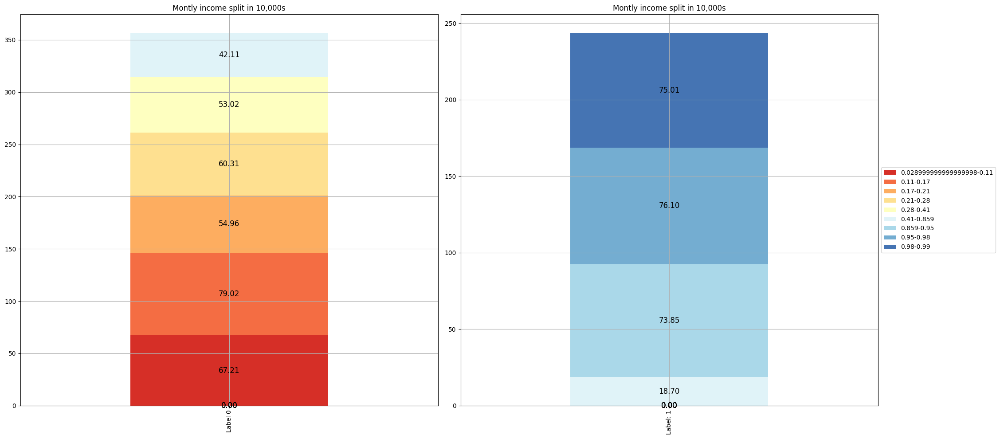

In [100]:
# showing split quantile
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
pal = sns.color_palette("RdYlBu", len(data_p['Range']))


margin = 0.05
width = (1.-2.*margin)/2

chart = data_p.set_index('Range').drop(columns=['Label: 1'])
chart2 = data_p.set_index('Range').drop(columns=['Label 0'])



chart.T.plot.bar(stacked=True, color = pal, grid=True, ax=ax1, width=width, legend=False)
for rect in ax1.patches:
    height = rect.get_height()
    width = rect.get_width()
    x = rect.get_x()
    y = rect.get_y()
    
    label_text = f'{height:.2f}'  
    
    label_x = x + width/2
    label_y = (y + height/2)

    ax1.text(label_x, label_y, label_text, ha='center', va='center', fontsize=12)

ax1.set_title(f"Montly income split in 10,000s")

chart2.T.plot.bar(stacked=True, color = pal, grid=True, ax=ax2, width=width, legend=False)
for rect in ax2.patches:
    height = rect.get_height()
    width = rect.get_width()
    x = rect.get_x()
    y = rect.get_y()
    
    label_text = f'{height:.2f}'  
    
    label_x = x + width/2
    label_y = (y + height/2)

    ax2.text(label_x, label_y, label_text, ha='center', va='center', fontsize=12)


plt.tight_layout()  # otherwise the right y-label is slightly clipped
ax2.set_title(f"Montly income split in 10,000s")

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

## ROC

In [67]:
def roc_predict(model, x, penalize_theta=0.1, promote_theta=0, label=0, absolute = True):
    y_pred = model.predict_proba(x)[:, 1]
    y_pred = y_pred + (-1) * penalize_theta * (y_pred > 0.5 ) * (y_pred < (0.5 + penalize_theta)) + promote_theta * (y_pred > (0.5 - promote_theta)) * (y_pred < 0.5)
    y_pred = pd.Series(y_pred)
    if absolute:
        y_pred = y_pred.apply(lambda x: 1 if x > 0.5 else 0)
    return np.array(y_pred)


weights are 0.8695252116304748, 1.3588056680161944, 1.1906155111336032, 0.7801911222963854


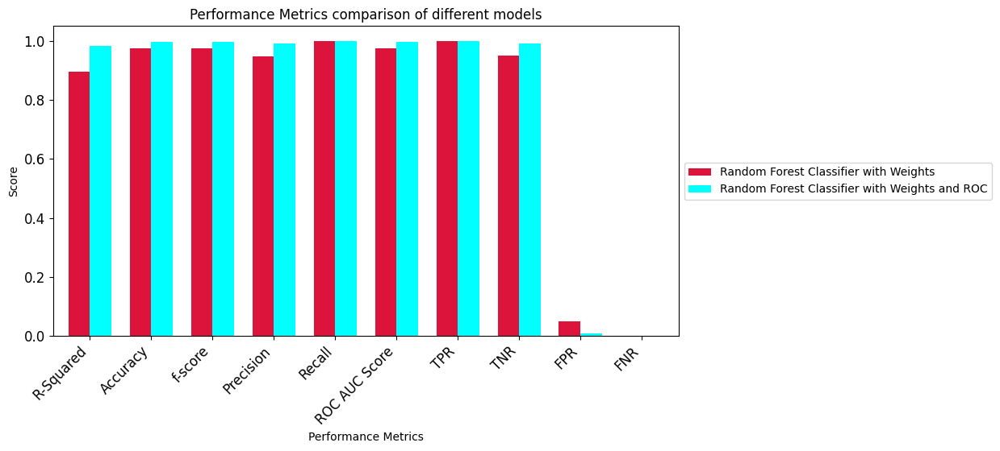

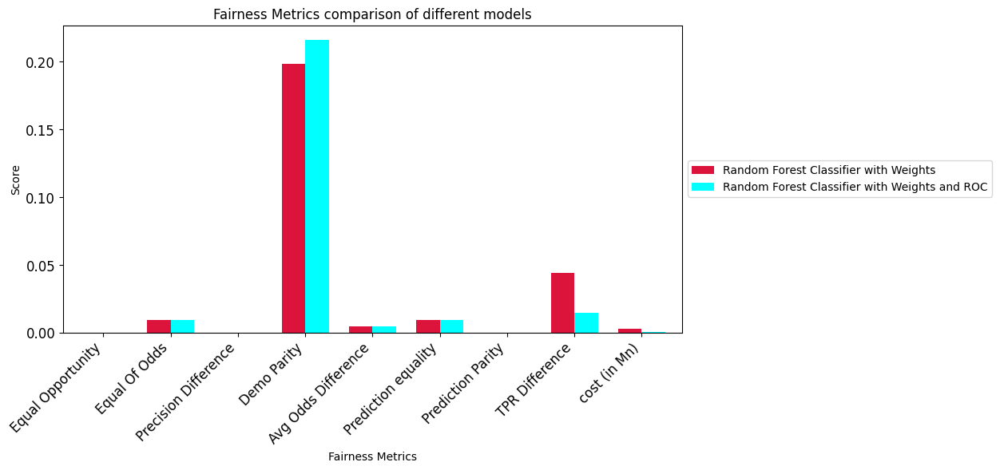

In [94]:
df_index = 0
df_performance_compare = pd.DataFrame(columns=evaluate_columns)
df_fairness_compare = pd.DataFrame(columns=fairness_matrics_columns)


train_x = X_train_dp[nonPiiCol]
train_y = y_train
test_x = X_test_dp[nonPiiCol]
test_y = y_test
train_x_weights = find_reweights_and_new_weights_column(
    column_name=single_discrimation_column, X_train=X_train, y_train=train_y
)

RFmodel = ensemble.RandomForestClassifier()
RFmodel.fit(train_x, train_y, sample_weight=train_x_weights)

pred_rf = RFmodel.predict(test_x)

df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Random Forest Classifier with Weights")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Random Forest Classifier with Weights",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1

pred_rf = roc_predict(RFmodel, test_x, penalize_theta=0.12)


df_performance_compare.loc[df_index] = evaluate(test_y, pred_rf, "Random Forest Classifier with Weights and ROC")
df_fairness_compare.loc[df_index] = evaluate_fairness_matrics(
    X_test,
    test_y,
    pred_rf,
    method="Random Forest Classifier with Weights and ROC",
    fairness_column=single_discrimation_column,
)
df_index = df_index + 1

draw_df_compare_graph(df_performance_compare, graph_title="Performance Metrics")
draw_df_compare_graph(df_fairness_compare, graph_title="Fairness Metrics")

In [73]:
df_performance_compare

,Method,R-Squared,Accuracy,f-score,Precision,Recall,ROC AUC Score,TPR,TNR,FPR,FNR
0,Random Forest Classifier with Weights,0.894626,0.973684,0.973523,0.948413,1.000000,0.974510,1.000000,0.949020,0.050980,0.000000
1,Random Forest Classifier with Weights and ROC,0.951366,0.987854,0.987500,0.983402,0.991632,0.987973,0.991632,0.984314,0.015686,0.008368


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=0e419041-1468-4eaf-a096-0fa36444bf2f' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>